In [62]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from sklearn.metrics import mean_squared_error , mean_absolute_error,r2_score
from sklearn.preprocessing import StandardScaler ,RobustScaler 
from sklearn.model_selection import GridSearchCV


# data reading and data preparation

In [63]:
df=pd.read_csv('jordan_temp_monthly.csv')
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,1901,7.31,12.75,15.53,17.75,19.61,24.21,26.30,26.23,23.76,20.22,14.18,10.85
1,1902,7.62,12.14,11.55,16.75,21.23,23.14,25.93,25.85,25.53,20.86,13.59,8.89
2,1903,6.68,7.98,10.71,16.97,21.44,22.71,24.41,25.33,22.57,18.61,12.73,9.91
3,1904,7.97,10.34,12.51,15.90,20.01,23.15,25.28,25.83,23.67,21.32,13.48,8.04
4,1905,6.14,6.97,10.80,17.10,21.65,23.74,26.71,26.67,25.02,21.52,16.07,8.51


In [64]:
jor_temp_df=pd.read_csv('jordan_temp_annual.csv')
jor_temp_df.head()


,Year,Jordan,Ajloon,Balqa,Aqaba,Karak,Amman,Tafiela,Irbid,Jarash,Ma'an,Madaba,Mafraq,Zarqa
0,1901,18.25,18.17,18.15,18.98,17.50,17.68,17.32,18.55,18.17,18.54,18.05,18.02,18.46
1,1902,17.78,17.67,17.65,18.50,17.01,17.18,16.84,18.04,17.67,18.05,17.55,17.58,17.96
2,1903,16.72,16.64,16.61,17.46,15.96,16.14,15.79,17.02,16.64,17.02,16.51,16.48,16.92
3,1904,17.31,17.23,17.21,18.07,16.57,16.72,16.40,17.61,17.23,17.61,17.12,17.05,17.49
4,1905,17.63,17.55,17.53,18.45,16.90,17.06,16.73,17.91,17.55,17.97,17.43,17.31,17.81


In [65]:
co2_df=pd.read_csv('jordan_co2_emissions.csv')
co2_df['co2_diff']=co2_df['CO2 Emissions'].diff()
co2_df['co2_prc']=co2_df['co2_diff'].pct_change()
co2_df.head()

,Year,CO2 Emissions,co2_diff,co2_prc
0,1950,172208.0,NaN,NaN
1,1951,333424.0,161216.0,NaN
2,1952,527616.0,194192.0,0.204545
3,1953,740128.0,212512.0,0.094340
4,1954,992677.0,252549.0,0.188399


In [66]:
land_df=pd.read_csv('climate-change_jor.csv')
land_df=land_df[land_df['Indicator Name']=='Agricultural land (sq. km)'].drop(['Country Name','Country ISO3','Indicator Name','Indicator Code'],axis=1)
land_df.head()

,Year,Value
0,2020,10290.0
1,2019,10365.0
2,2018,10218.0
3,2017,10070.0
4,2016,10659.6


In [67]:
rain_df=pd.read_csv('pr_timeseries_monthly_cru_1901-2021_JOR.csv')
rain_df['Jordan']=rain_df.iloc[:,1:].mean(axis=1)
rain_df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Jordan
0,1901,31.91,3.56,7.99,4.93,16.20,0.09,0.07,0.07,0.03,2.61,10.35,22.80,8.384167
1,1902,38.02,10.77,13.56,12.99,1.82,0.09,0.07,0.07,0.03,4.57,27.11,24.72,11.151667
2,1903,26.50,21.47,19.78,3.98,1.15,0.10,0.07,0.07,0.03,1.99,9.87,14.66,8.305833
3,1904,33.70,15.50,22.84,11.68,2.90,0.10,0.07,0.07,0.03,5.82,20.85,48.28,13.486667
4,1905,20.72,26.72,33.62,12.97,3.26,0.13,0.07,0.07,0.08,5.22,4.31,44.39,12.630000


In [68]:
elec=pd.read_csv('Electricity consumption - Jordan.csv')
elec

,Year,Electricity consumption,Units
0,1990,3.33,TWh
1,1995,5.09,TWh
2,2000,6.61,TWh
3,2005,9.10,TWh
4,2010,13.40,TWh
5,2015,17.37,TWh
6,2020,18.93,TWh


In [69]:
elec_by_sector=pd.read_csv('Electricity consumption by sector - Jordan.csv')
elec_by_sector

,Year,Industry,Residential,Commercial and public services,Agriculture / forestry,Units
0,1990,4280,3146,1555,1962,TJ
1,1995,5731,5119,4043,3186,TJ
2,2000,6563,7132,4486,3564,TJ
3,2005,9018,11466,6559,4673,TJ
4,2010,11225,18810,9230,6725,TJ
5,2015,13338,26021,10022,8683,TJ
6,2020,15218,32760,10930,10319,TJ


# data smoothing technics 


In [70]:
# data smoothing function 
def take_range(data,column,step):
    new_temps=[]
    new_years=[]
    for i in range(0,len(data)-step,step):
        tot=0
        for j in range(i,i+step,1):
            tot+=data[column][j]
        new_temps.append(tot/step)
        # new_years.append(f"{data['Year'][i]}-{data['Year'][j]}")
        new_years.append(data['Year'][i])

    return pd.DataFrame({'year':new_years,'value':new_temps})

# savgol_filter function was better 

In [71]:
def data_smother_visualizer(data_rame,wanted_col,polly=1):
    new_data=savgol_filter(data_rame[wanted_col],10,polly) # data smoother 
    newdata_rame=pd.DataFrame({'year':data_rame['Year'],'value':new_data})
    print(wanted_col)
    print(newdata_rame)
    print(f"dalta value= {newdata_rame['value'][len(newdata_rame)-1]-newdata_rame['value'][0]}")

    fig, ax1 = plt.subplots(figsize=(8,4))

    plot1=ax1.plot(newdata_rame['year'],newdata_rame['value'], color='tab:blue',label="Smothed data")
    ax1.set_ylabel('smothed data')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('original data')  
    plot2=ax2.plot(data_rame['Year'],data_rame[wanted_col], color='tab:red',alpha=0.5,label="Original data")

    fig.tight_layout()
    plt.title(wanted_col)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    plt.show()
    
    data_rame[f'annual_change_{wanted_col}']=data_rame[wanted_col].pct_change()
    fig, ax = plt.subplots(figsize=(8,4))
    print(f"average annual change percentage = {data_rame[f'annual_change_{wanted_col}'].mean()*100}%")

    ax.plot(data_rame['Year'],data_rame[f'annual_change_{wanted_col}']*100,label='annual change percentage')

    ax.axhline(y=0, lw=1, color='k',alpha=1)
    ax.axhline(y=data_rame[f'annual_change_{wanted_col}'].mean()*100, lw=1, color='blue',alpha=.8)

    plt.title(f"annual change percentage {wanted_col}")
    plt.grid()
    plt.show()
    data_rame[f'{wanted_col}_smoothed']=new_data

# data vis

## visualizing the temperature for each month before and after smoothing

Jan
     year     value
0    1901  7.131273
1    1902  7.199879
2    1903  7.268485
3    1904  7.337091
4    1905  7.405697
..    ...       ...
116  2017  9.372364
117  2018  9.443091
118  2019  9.513818
119  2020  9.584545
120  2021  9.655273

[121 rows x 2 columns]
dalta value= 2.523999999999999


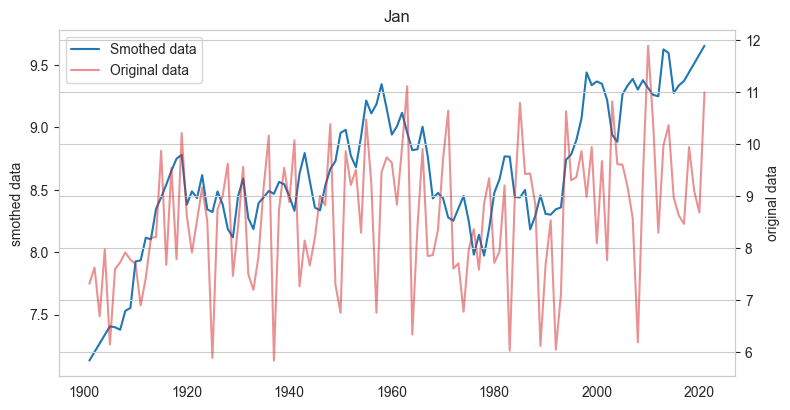

average annual change percentage = 2.3273156680330622%


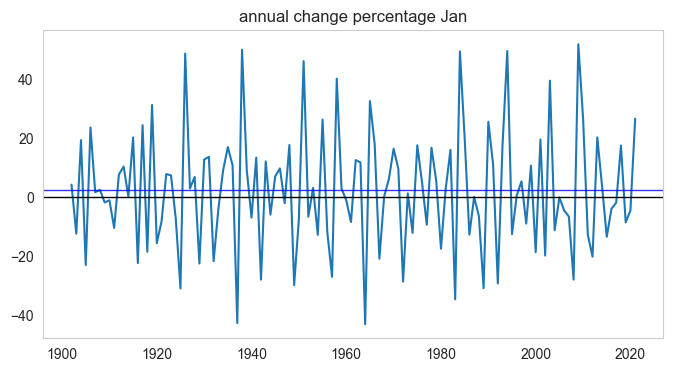

Feb
     year      value
0    1901  10.751091
1    1902  10.546848
2    1903  10.342606
3    1904  10.138364
4    1905   9.934121
..    ...        ...
116  2017  11.596909
117  2018  11.652727
118  2019  11.708545
119  2020  11.764364
120  2021  11.820182

[121 rows x 2 columns]
dalta value= 1.069090909090903


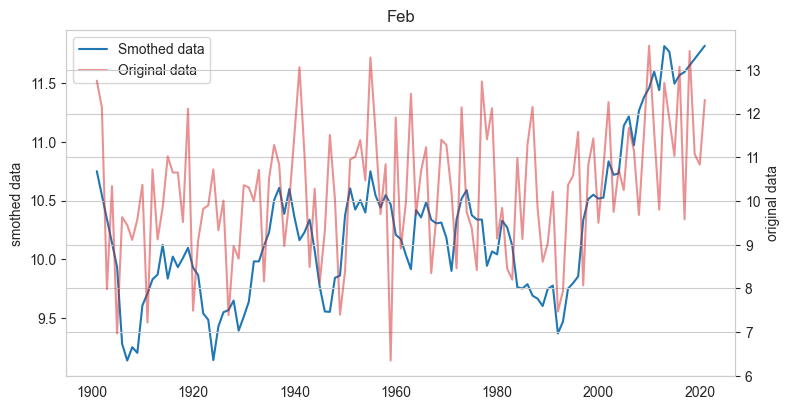

average annual change percentage = 2.0943098371055036%


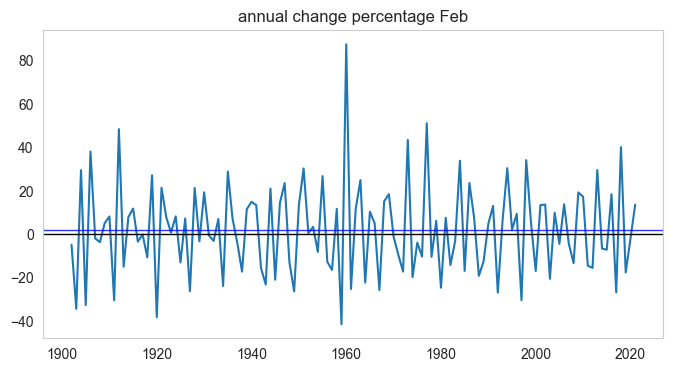

Mar
     year      value
0    1901  12.816182
1    1902  12.655030
2    1903  12.493879
3    1904  12.332727
4    1905  12.171576
..    ...        ...
116  2017  14.915152
117  2018  14.909455
118  2019  14.903758
119  2020  14.898061
120  2021  14.892364

[121 rows x 2 columns]
dalta value= 2.076181818181814


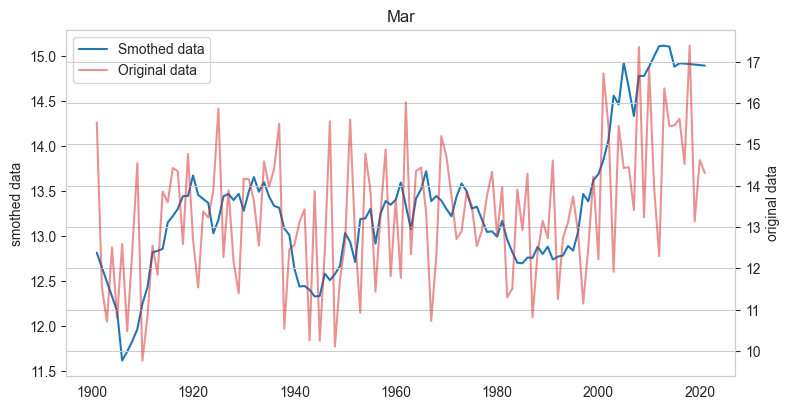

average annual change percentage = 1.3036365350017085%


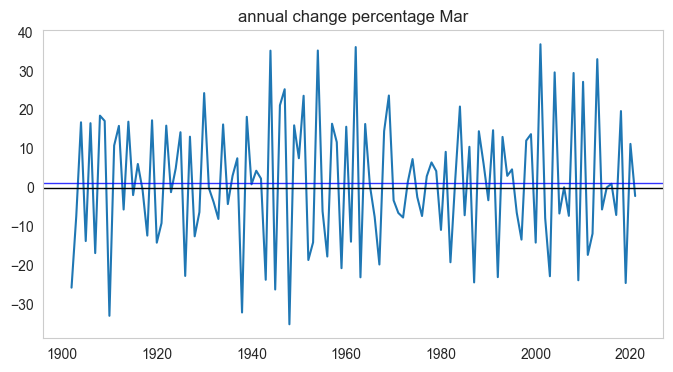

Apr
     year      value
0    1901  16.995273
1    1902  16.949212
2    1903  16.903152
3    1904  16.857091
4    1905  16.811030
..    ...        ...
116  2017  19.262424
117  2018  19.177273
118  2019  19.092121
119  2020  19.006970
120  2021  18.921818

[121 rows x 2 columns]
dalta value= 1.926545454545451


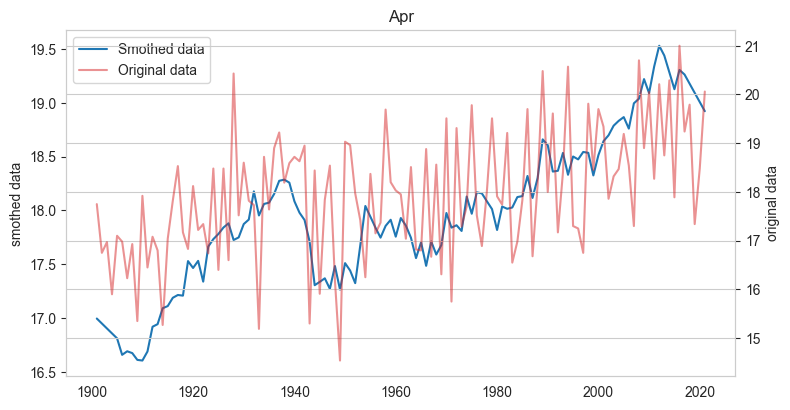

average annual change percentage = 0.6116110257743854%


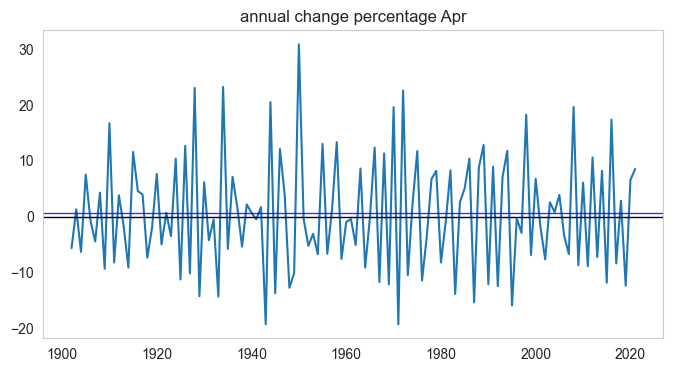

May
     year      value
0    1901  20.159091
1    1902  20.404848
2    1903  20.650606
3    1904  20.896364
4    1905  21.142121
..    ...        ...
116  2017  24.013939
117  2018  24.103818
118  2019  24.193697
119  2020  24.283576
120  2021  24.373455

[121 rows x 2 columns]
dalta value= 4.2143636363636325


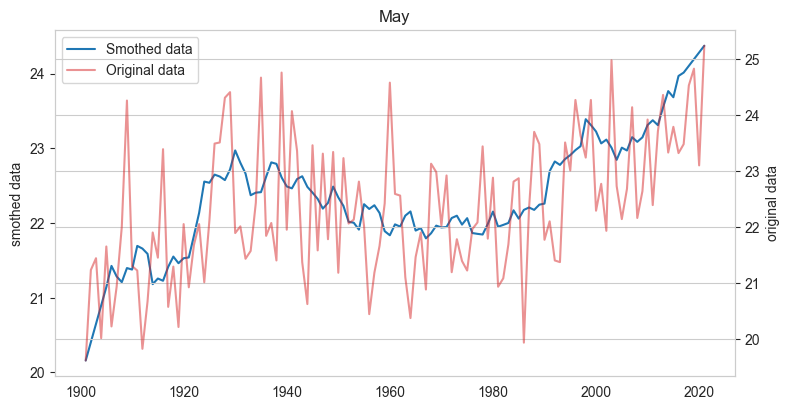

average annual change percentage = 0.4114069261767948%


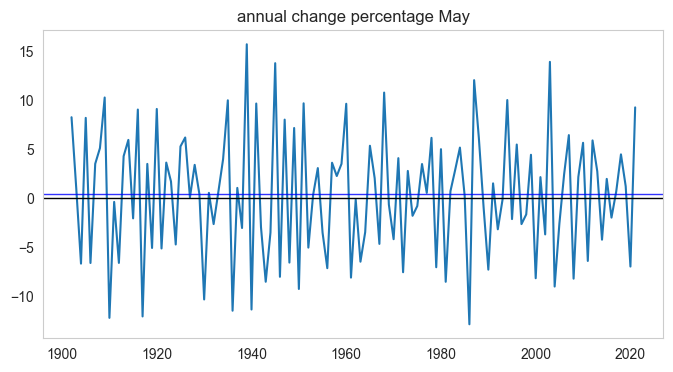

Jun
     year      value
0    1901  23.320727
1    1902  23.430121
2    1903  23.539515
3    1904  23.648909
4    1905  23.758303
..    ...        ...
116  2017  26.400121
117  2018  26.370364
118  2019  26.340606
119  2020  26.310848
120  2021  26.281091

[121 rows x 2 columns]
dalta value= 2.9603636363636383


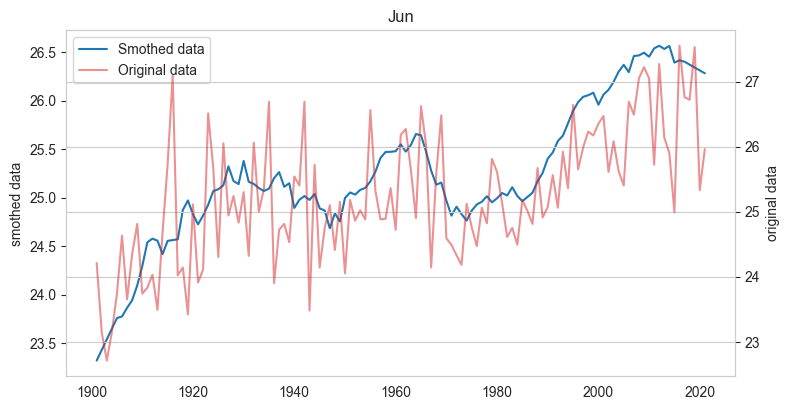

average annual change percentage = 0.1433076267314361%


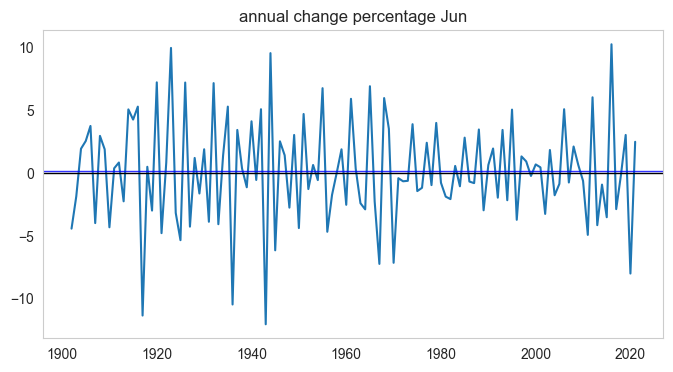

Jul
     year      value
0    1901  25.533455
1    1902  25.650242
2    1903  25.767030
3    1904  25.883818
4    1905  26.000606
..    ...        ...
116  2017  28.794061
117  2018  28.848182
118  2019  28.902303
119  2020  28.956424
120  2021  29.010545

[121 rows x 2 columns]
dalta value= 3.477090909090908


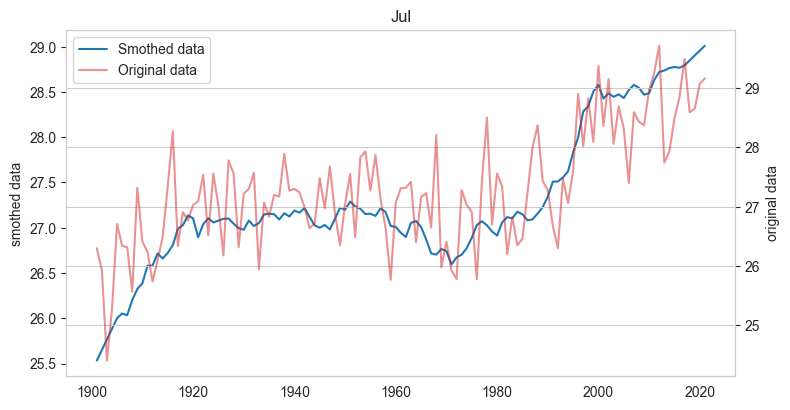

average annual change percentage = 0.13386730495539473%


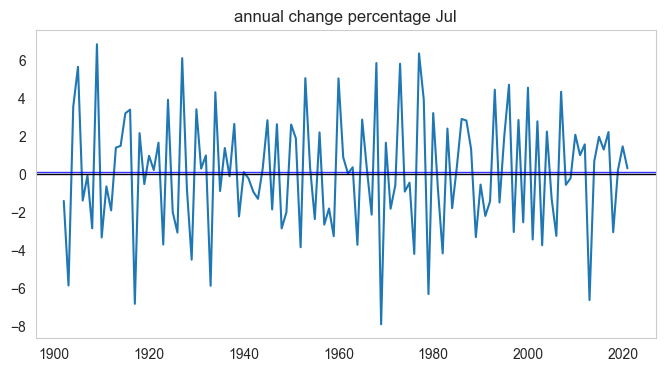

Aug
     year      value
0    1901  25.743455
1    1902  25.860242
2    1903  25.977030
3    1904  26.093818
4    1905  26.210606
..    ...        ...
116  2017  28.850182
117  2018  28.844545
118  2019  28.838909
119  2020  28.833273
120  2021  28.827636

[121 rows x 2 columns]
dalta value= 3.0841818181818184


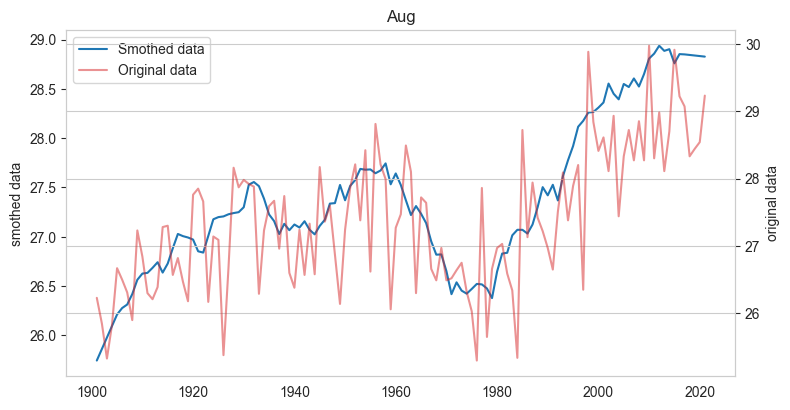

average annual change percentage = 0.15760378038450742%


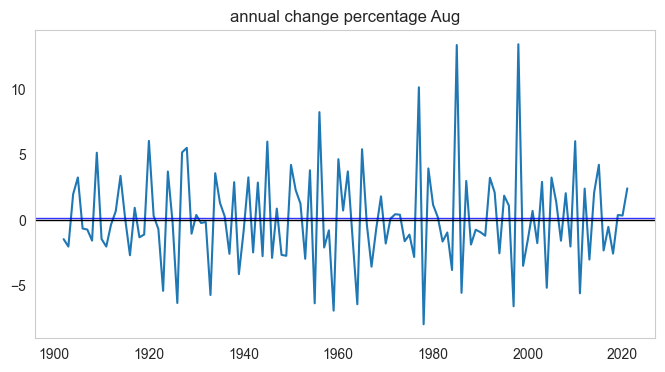

Sep
     year      value
0    1901  23.947091
1    1902  23.967515
2    1903  23.987939
3    1904  24.008364
4    1905  24.028788
..    ...        ...
116  2017  26.669818
117  2018  26.727455
118  2019  26.785091
119  2020  26.842727
120  2021  26.900364

[121 rows x 2 columns]
dalta value= 2.953272727272722


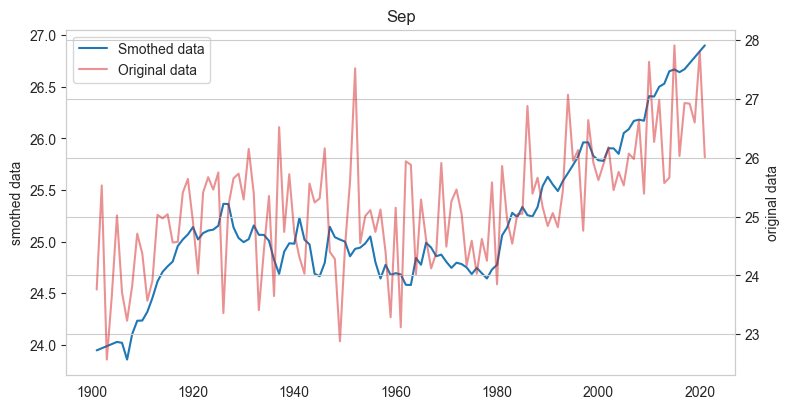

average annual change percentage = 0.18492388433205598%


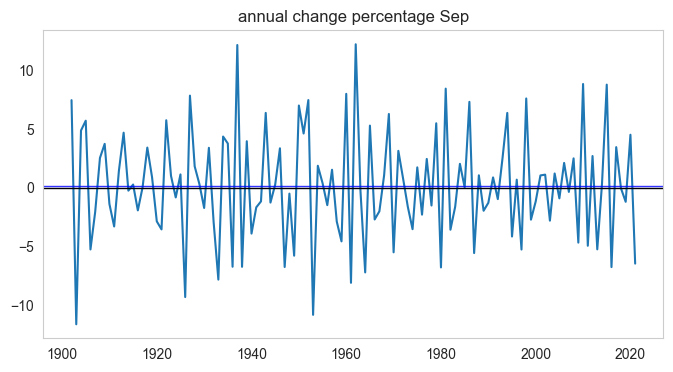

Oct
     year      value
0    1901  20.575091
1    1902  20.491515
2    1903  20.407939
3    1904  20.324364
4    1905  20.240788
..    ...        ...
116  2017  22.168061
117  2018  22.316182
118  2019  22.464303
119  2020  22.612424
120  2021  22.760545

[121 rows x 2 columns]
dalta value= 2.185454545454551


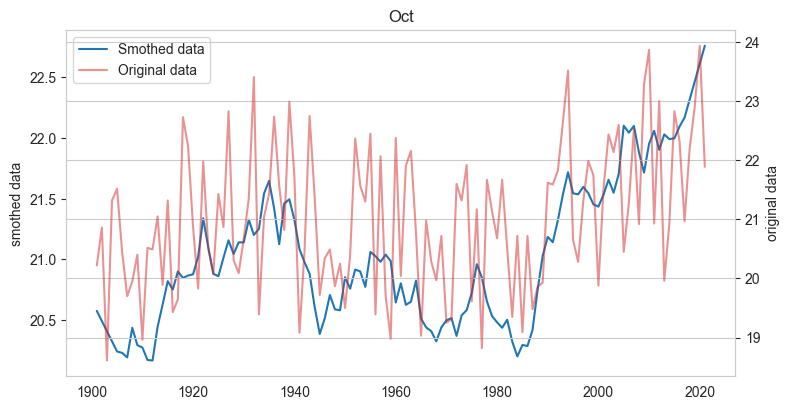

average annual change percentage = 0.3380673226060076%


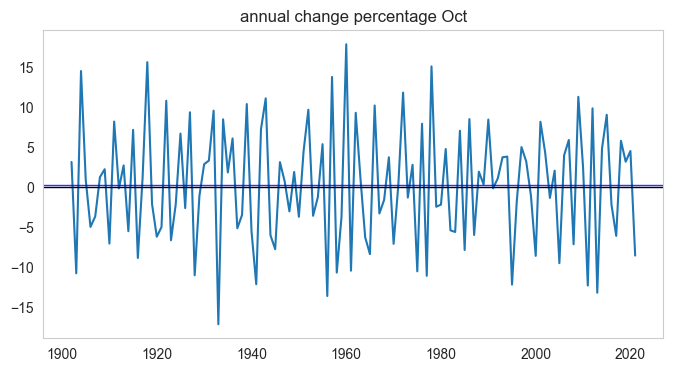

Nov
     year      value
0    1901  13.769636
1    1902  13.827273
2    1903  13.884909
3    1904  13.942545
4    1905  14.000182
..    ...        ...
116  2017  16.310485
117  2018  16.297455
118  2019  16.284424
119  2020  16.271394
120  2021  16.258364

[121 rows x 2 columns]
dalta value= 2.4887272727272745


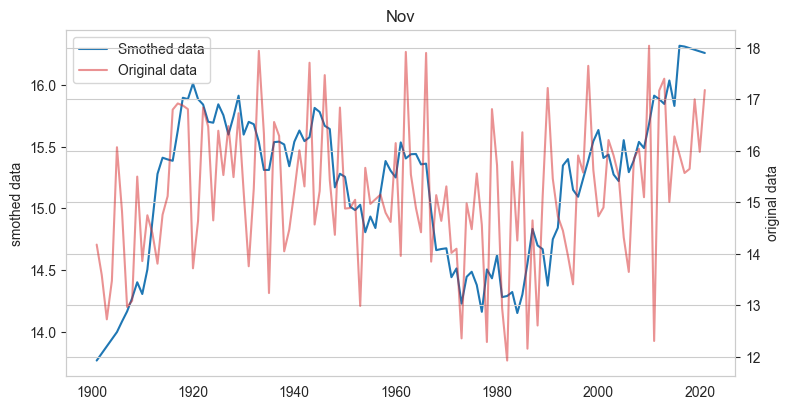

average annual change percentage = 0.9490005419598744%


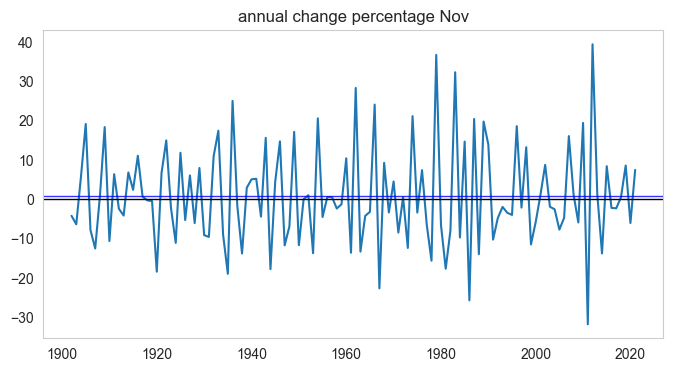

Dec
     year      value
0    1901   9.646545
1    1902   9.623091
2    1903   9.599636
3    1904   9.576182
4    1905   9.552727
..    ...        ...
116  2017  11.371455
117  2018  11.474364
118  2019  11.577273
119  2020  11.680182
120  2021  11.783091

[121 rows x 2 columns]
dalta value= 2.13654545454545


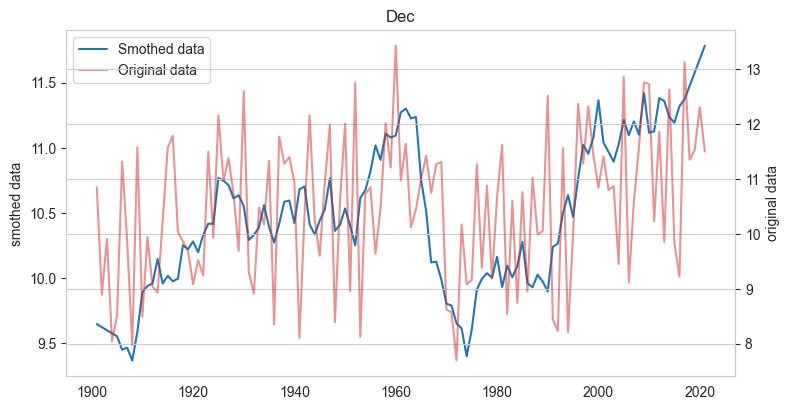

average annual change percentage = 1.7439994705663806%


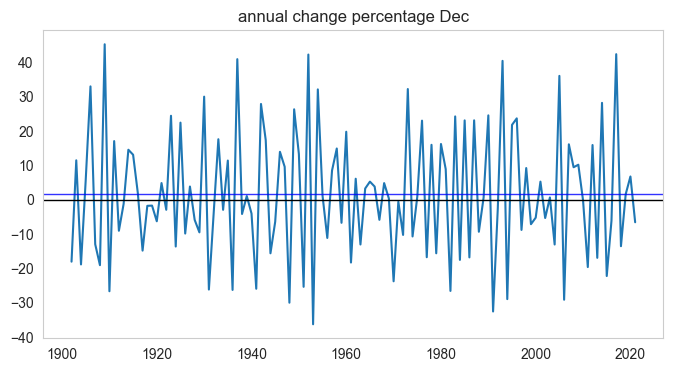

In [72]:
monthss=df.columns[1:]
for wanted_month in monthss:    
    data_smother_visualizer(df,wanted_month)

    

## monthly temp data distribution

<Figure size 640x480 with 0 Axes>

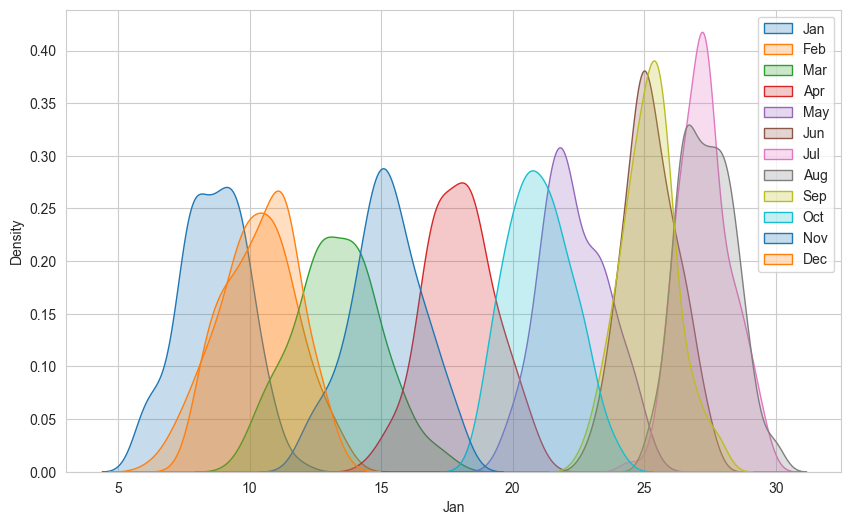

In [73]:
sns.set_style("whitegrid")
sns.despine()
    
plt.subplots(figsize=(10, 6))

ax =sns.kdeplot(df, x=monthss[0],fill=True,label=monthss[0])
for month in monthss[1:]:
    ax=sns.kdeplot(df, x=month,fill=True,ax=ax,label=month)

ax.legend()

plt.show()

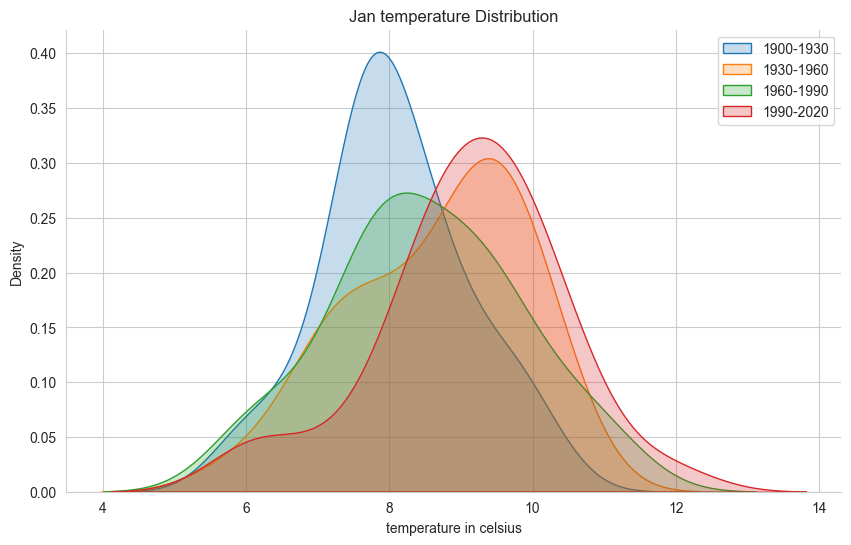

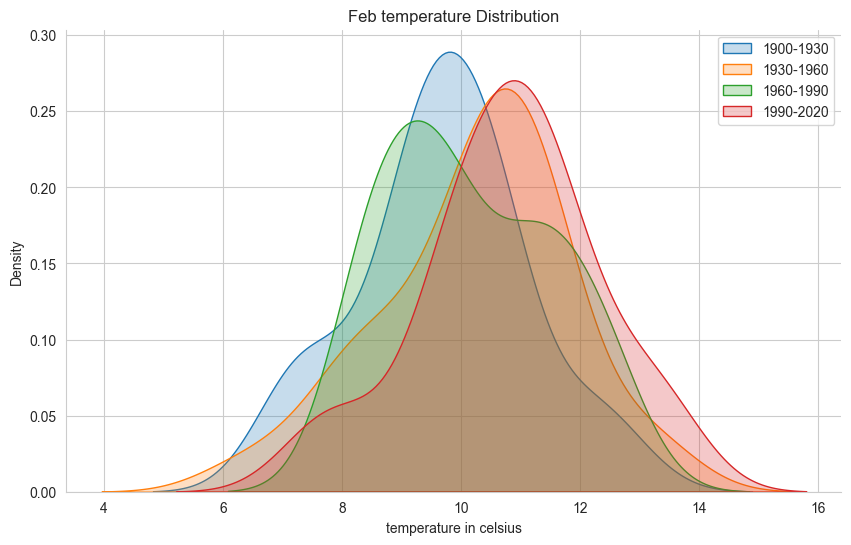

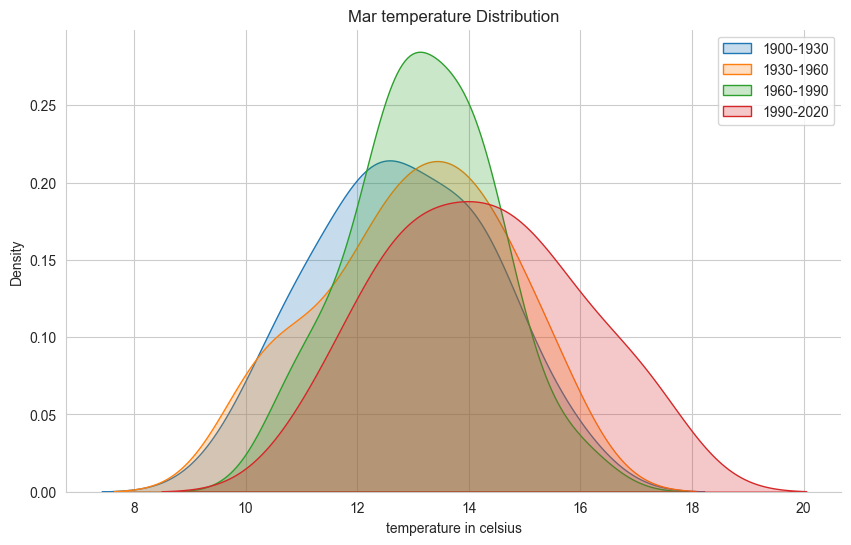

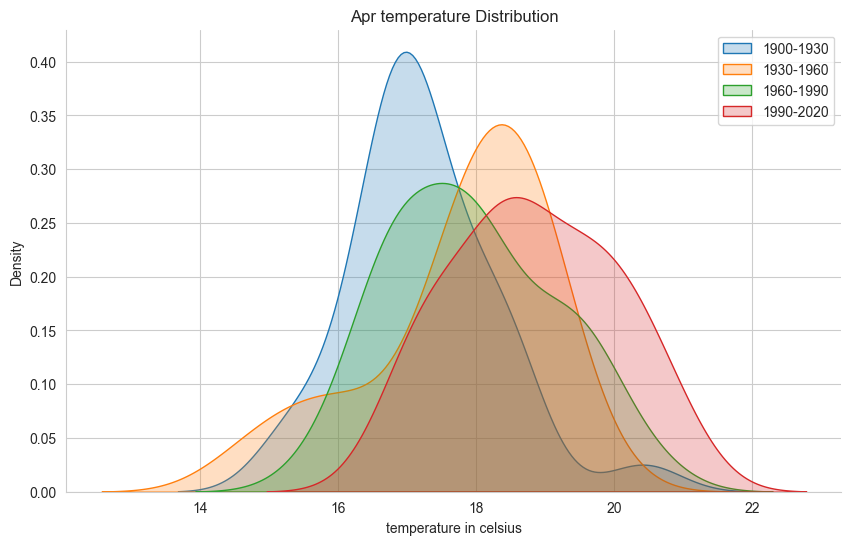

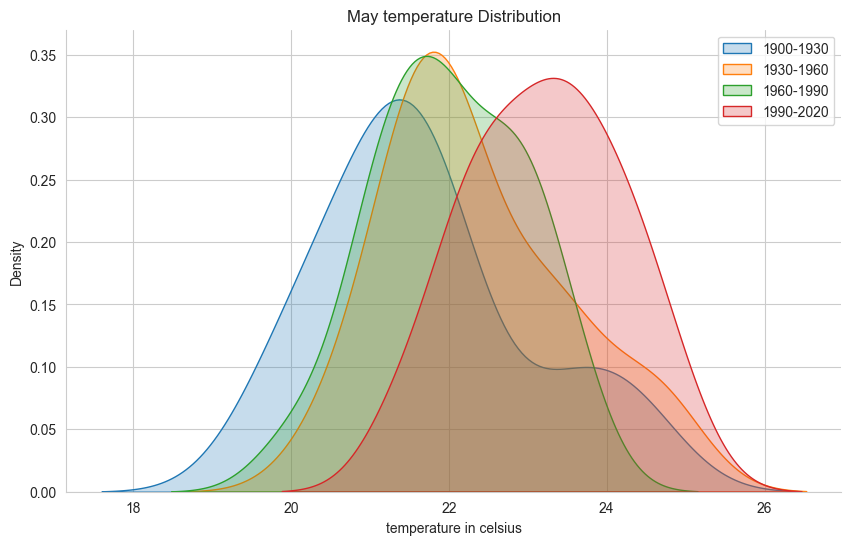

...

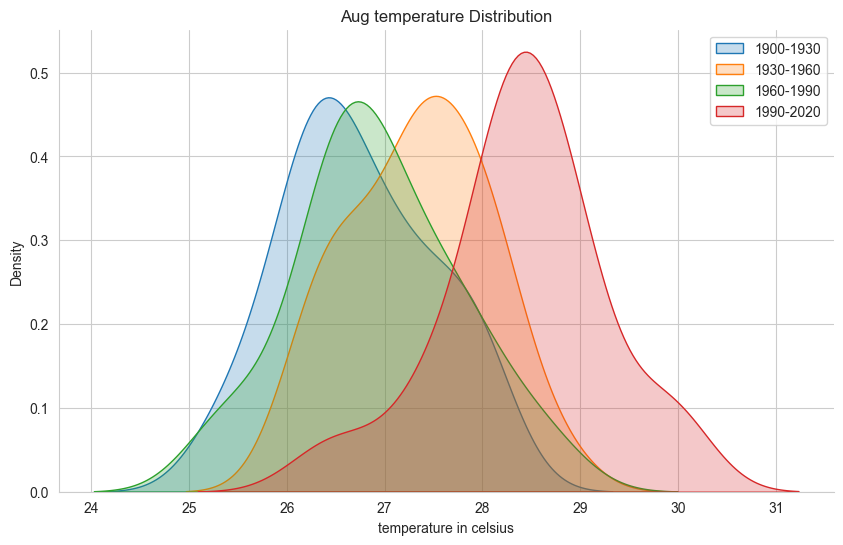

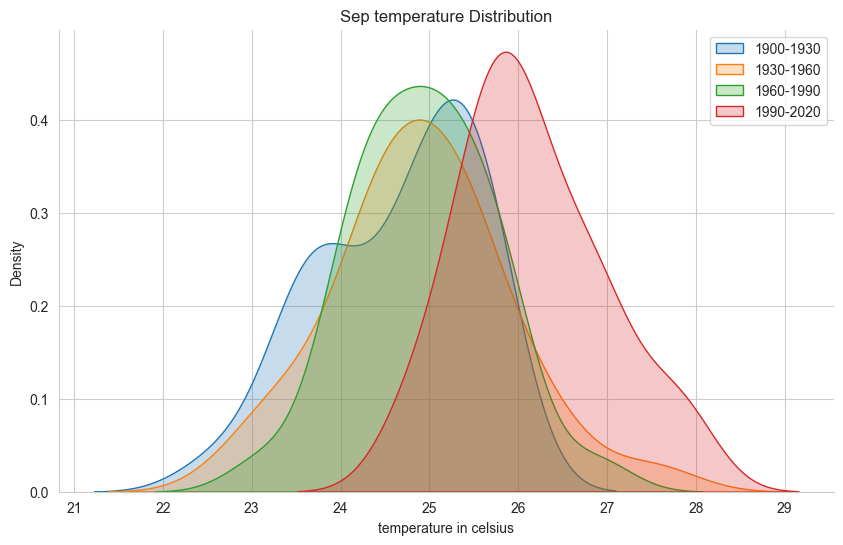

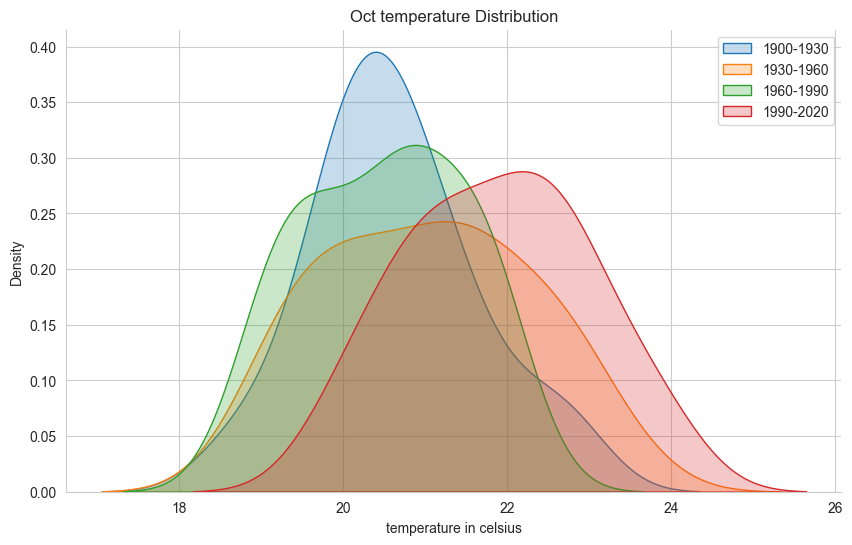

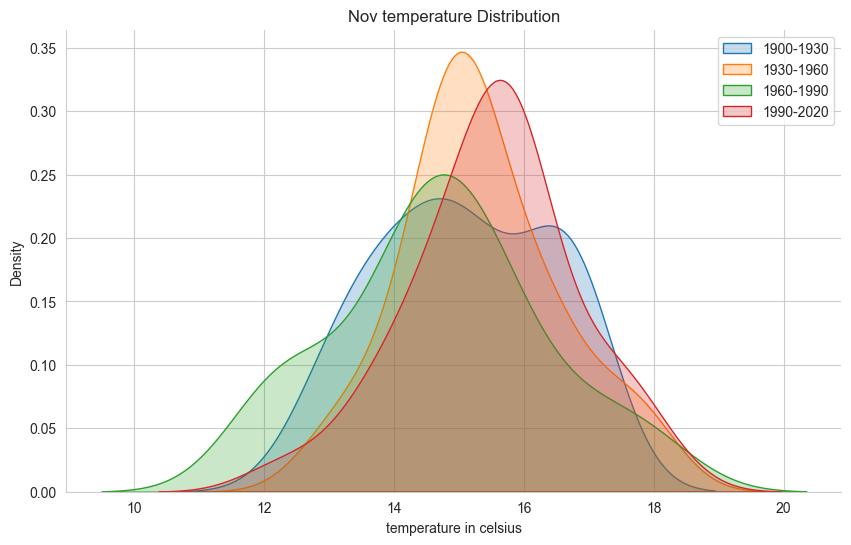

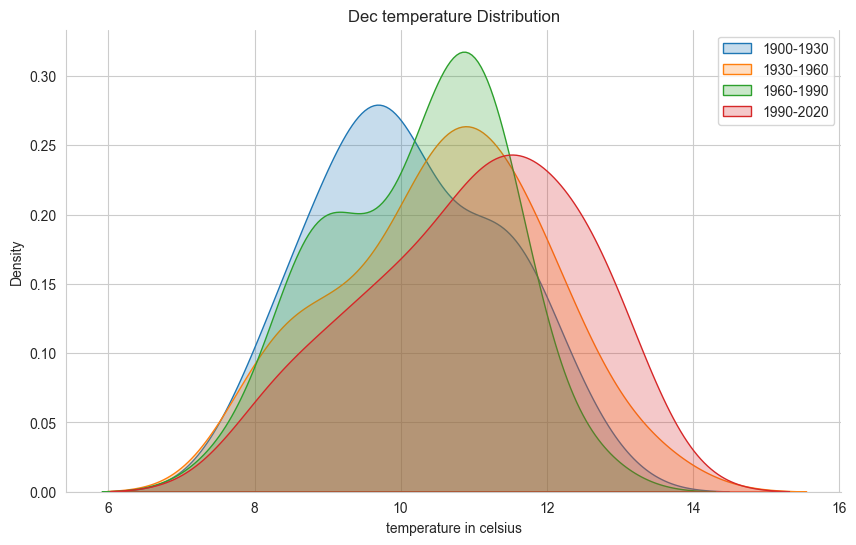

In [74]:
fill=True
for month in monthss:
    plt.subplots(figsize=(10, 6))
    sns.set_style("whitegrid")
    sns.despine()
    ax =sns.kdeplot(df[0:30], fill=fill,x=month,label=f"1900-1930")

    for start in range(30,130,30):
        end=start+30
        if end >= 100 and start>=100:
            label=f"20{start-100}-20{end-100}"
        elif end >= 100 and start<100:
            label=f"19{start}-20{end-100}"
        else:
            label=f"19{start}-19{end}"
        ax=sns.kdeplot(df[start:end], fill=fill, x=month,ax=ax,label=label,warn_singular=False)
    ax.set_title(f'{month} temperature Distribution')
    ax.set_xlabel("temperature in celsius")
    ax.legend()
    plt.show()

## the temps for all months in one chart

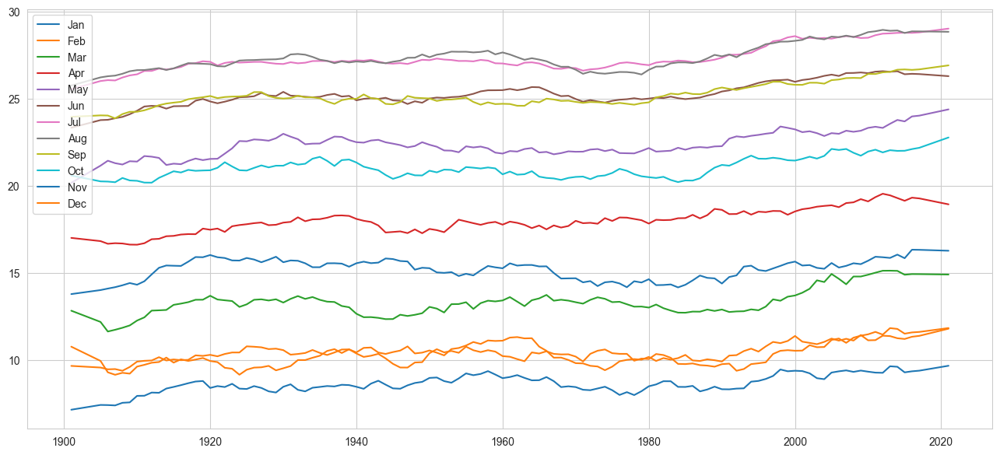

In [75]:
plt.figure(figsize=(16,7))
for wanted_month in monthss:    
    new_data=savgol_filter(df[wanted_month],10,1)
    newdf=pd.DataFrame({'year':df['Year'],'temp':new_data})
    plt.plot(newdf['year'],newdf['temp'],label=wanted_month)
plt.legend(loc='upper left')
plt.show()

## visualizing the temperature for each governates before and after smoothing

Jordan
     year      value
0    1901  17.562364
1    1902  17.582061
2    1903  17.601758
3    1904  17.621455
4    1905  17.641152
..    ...        ...
116  2017  20.014848
117  2018  20.052545
118  2019  20.090242
119  2020  20.127939
120  2021  20.165636

[121 rows x 2 columns]
dalta value= 2.6032727272727243


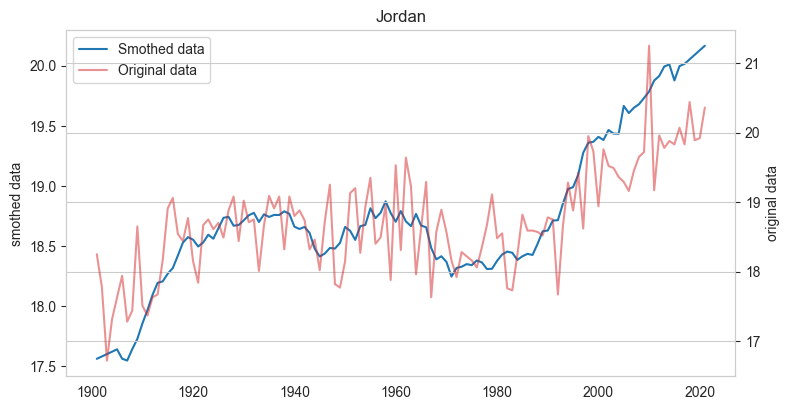

average annual change percentage = 0.14959693662653467%


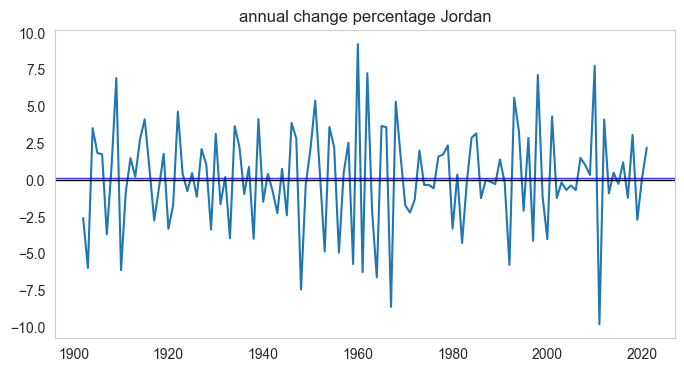

Ajloon
     year      value
0    1901  17.478727
1    1902  17.495455
2    1903  17.512182
3    1904  17.528909
4    1905  17.545636
..    ...        ...
116  2017  19.943333
117  2018  19.984000
118  2019  20.024667
119  2020  20.065333
120  2021  20.106000

[121 rows x 2 columns]
dalta value= 2.6272727272727288


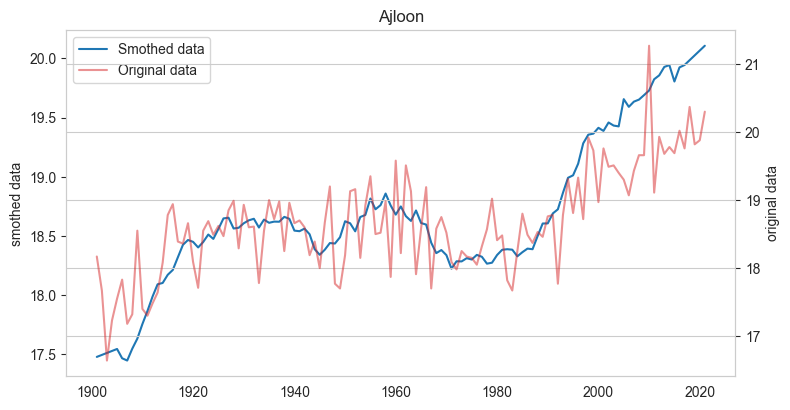

average annual change percentage = 0.15063711070434951%


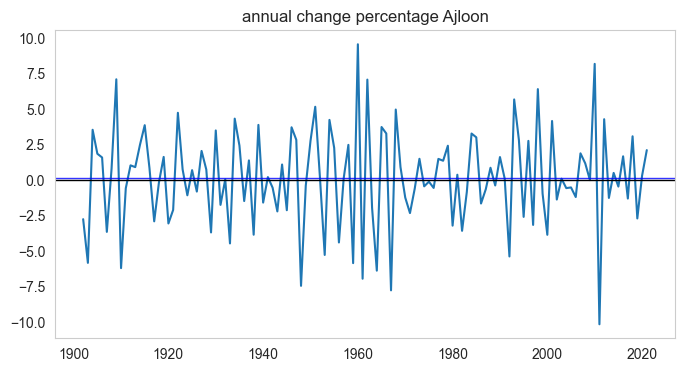

Balqa
     year      value
0    1901  17.455455
1    1902  17.473576
2    1903  17.491697
3    1904  17.509818
4    1905  17.527939
..    ...        ...
116  2017  19.916485
117  2018  19.955455
118  2019  19.994424
119  2020  20.033394
120  2021  20.072364

[121 rows x 2 columns]
dalta value= 2.616909090909086


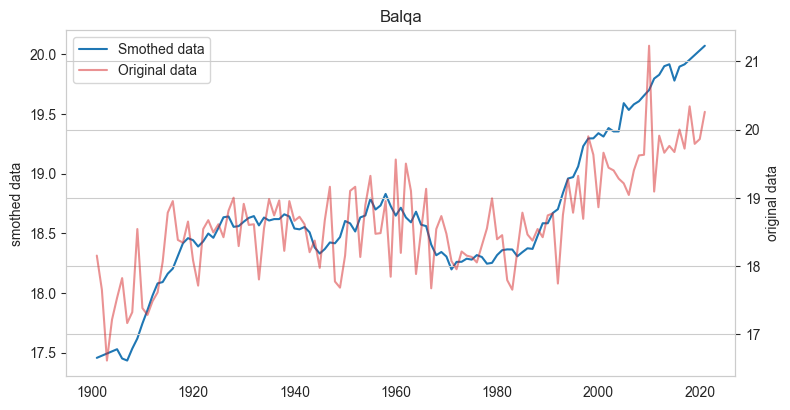

average annual change percentage = 0.14997103996044425%


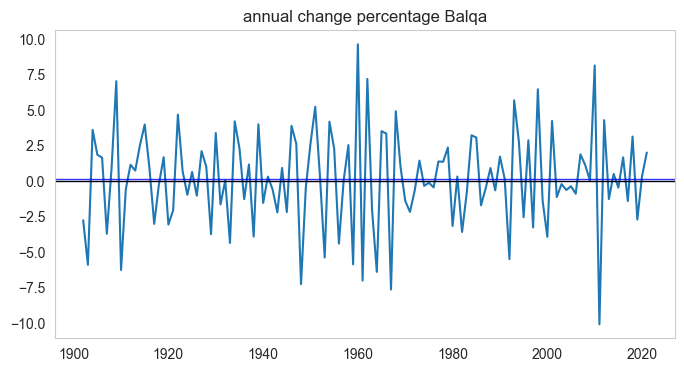

Aqaba
     year      value
0    1901  18.287273
1    1902  18.327879
2    1903  18.368485
3    1904  18.409091
4    1905  18.449697
..    ...        ...
116  2017  20.746606
117  2018  20.771818
118  2019  20.797030
119  2020  20.822242
120  2021  20.847455

[121 rows x 2 columns]
dalta value= 2.5601818181818246


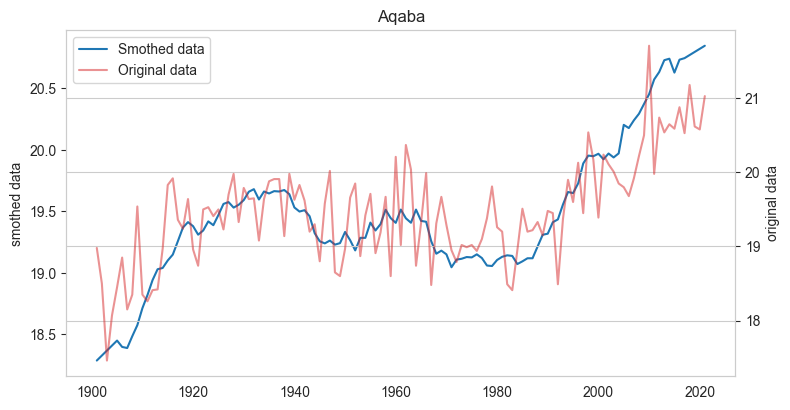

average annual change percentage = 0.1340612846737362%


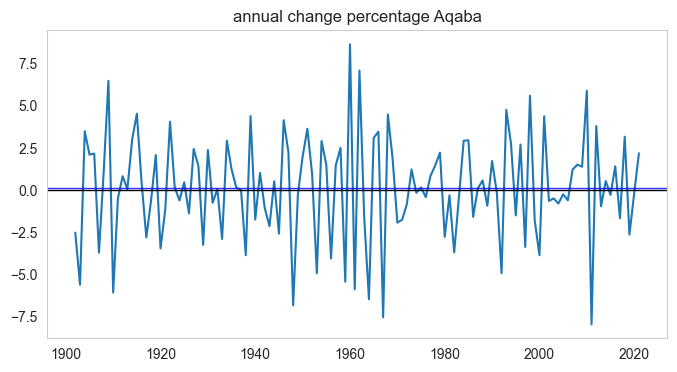

Karak
     year      value
0    1901  16.809636
1    1902  16.831939
2    1903  16.854242
3    1904  16.876545
4    1905  16.898848
..    ...        ...
116  2017  19.260909
117  2018  19.296727
118  2019  19.332545
119  2020  19.368364
120  2021  19.404182

[121 rows x 2 columns]
dalta value= 2.5945454545454503


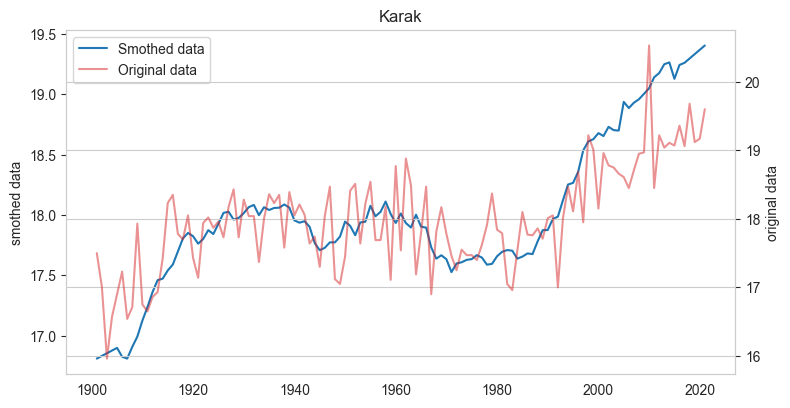

average annual change percentage = 0.1563509197933797%


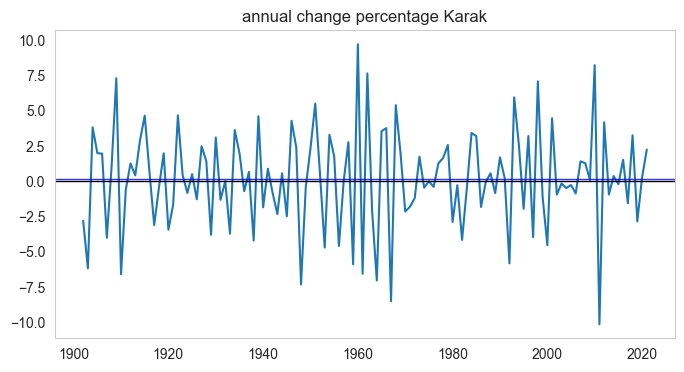

Amman
     year      value
0    1901  16.980727
1    1902  17.000788
2    1903  17.020848
3    1904  17.040909
4    1905  17.060970
..    ...        ...
116  2017  19.454364
117  2018  19.495091
118  2019  19.535818
119  2020  19.576545
120  2021  19.617273

[121 rows x 2 columns]
dalta value= 2.6365454545454554


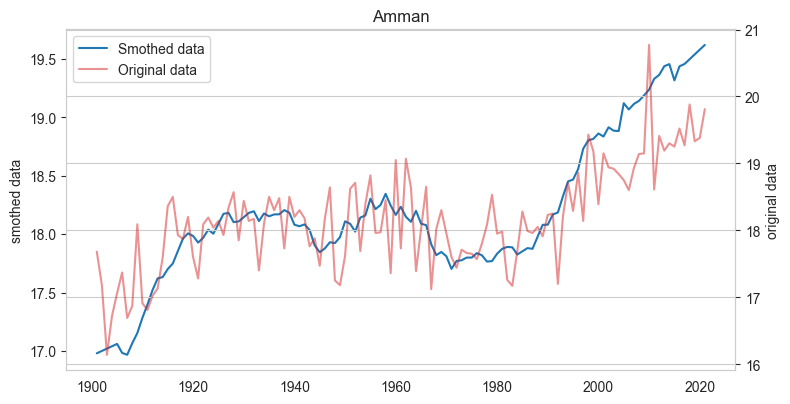

average annual change percentage = 0.15688294887451826%


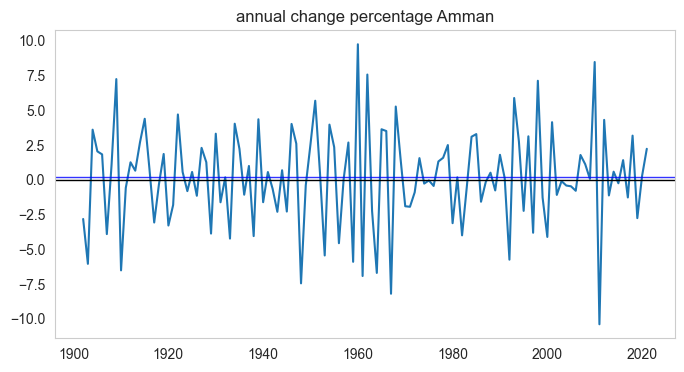

Tafiela
     year      value
0    1901  16.635818
1    1902  16.660970
2    1903  16.686121
3    1904  16.711273
4    1905  16.736424
..    ...        ...
116  2017  19.086121
117  2018  19.120364
118  2019  19.154606
119  2020  19.188848
120  2021  19.223091

[121 rows x 2 columns]
dalta value= 2.5872727272727225


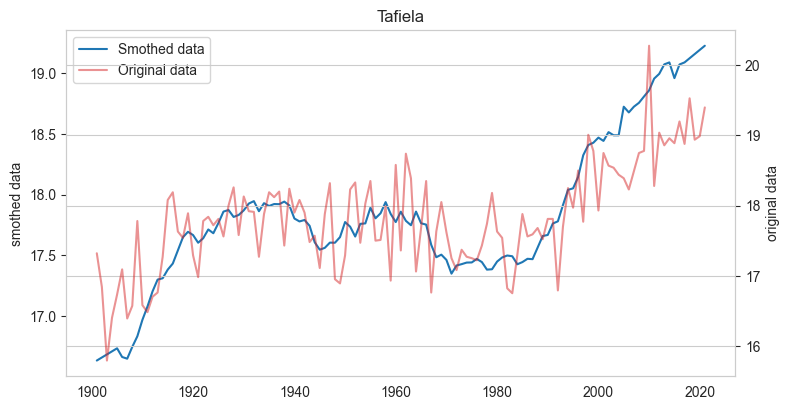

average annual change percentage = 0.15680166535011847%


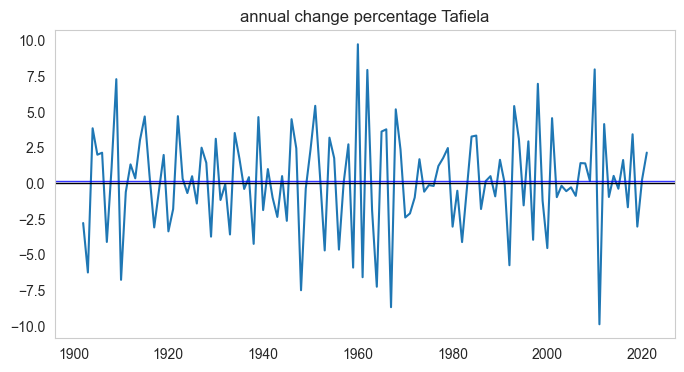

Irbid
     year      value
0    1901  17.858909
1    1902  17.870485
2    1903  17.882061
3    1904  17.893636
4    1905  17.905212
..    ...        ...
116  2017  20.328909
117  2018  20.372727
118  2019  20.416545
119  2020  20.460364
120  2021  20.504182

[121 rows x 2 columns]
dalta value= 2.645272727272726


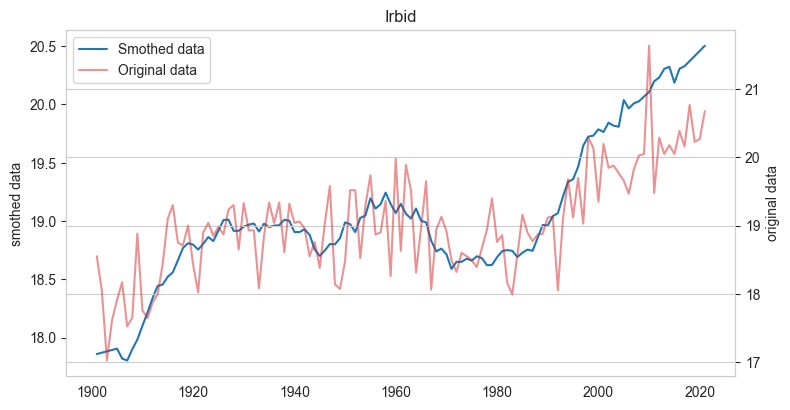

average annual change percentage = 0.14812334256099782%


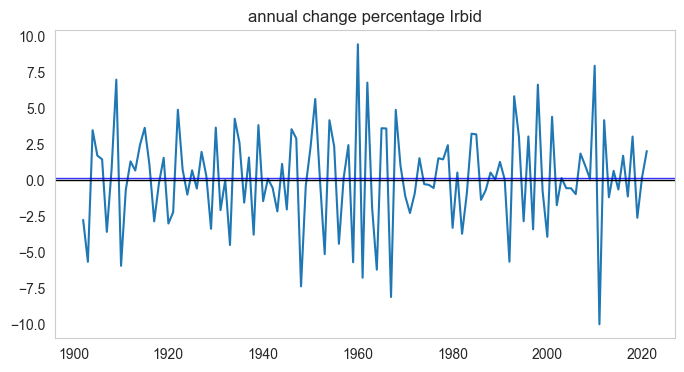

Jarash
     year      value
0    1901  17.478727
1    1902  17.495455
2    1903  17.512182
3    1904  17.528909
4    1905  17.545636
..    ...        ...
116  2017  19.943333
117  2018  19.984000
118  2019  20.024667
119  2020  20.065333
120  2021  20.106000

[121 rows x 2 columns]
dalta value= 2.6272727272727288


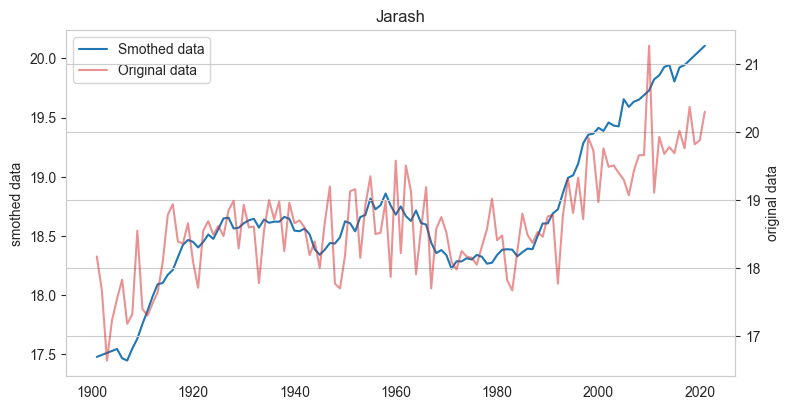

average annual change percentage = 0.15063711070434951%


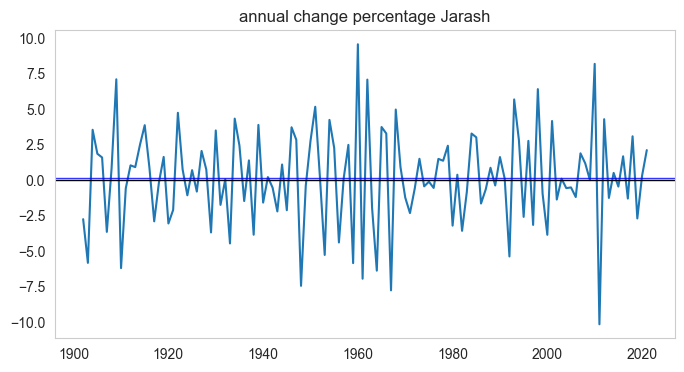

Ma'an
     year      value
0    1901  17.846182
1    1902  17.878364
2    1903  17.910545
3    1904  17.942727
4    1905  17.974909
..    ...        ...
116  2017  20.321576
117  2018  20.356727
118  2019  20.391879
119  2020  20.427030
120  2021  20.462182

[121 rows x 2 columns]
dalta value= 2.6160000000000068


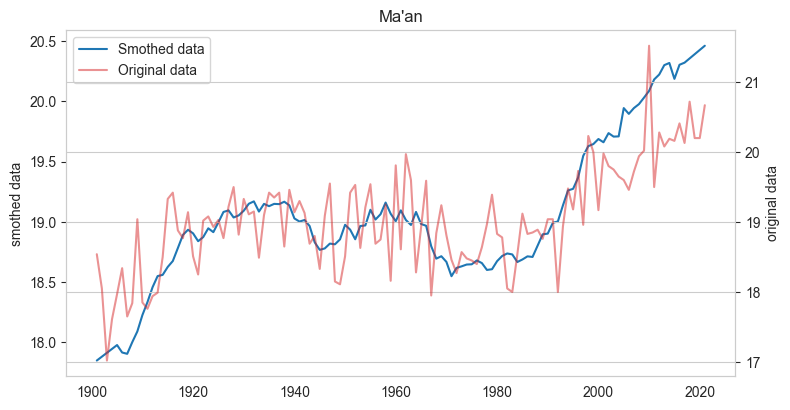

average annual change percentage = 0.14554019853046607%


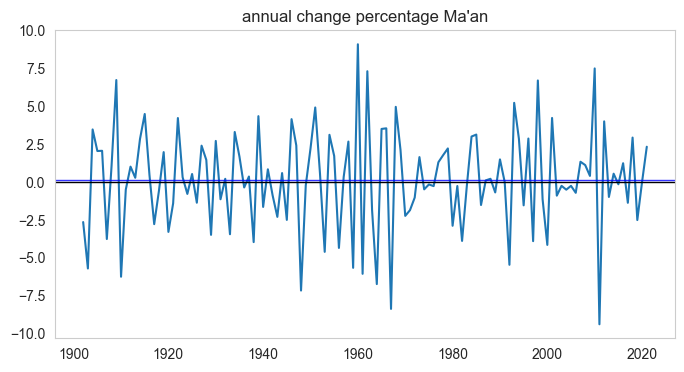

Madaba
     year      value
0    1901  17.354909
1    1902  17.375818
2    1903  17.396727
3    1904  17.417636
4    1905  17.438545
..    ...        ...
116  2017  19.809758
117  2018  19.847273
118  2019  19.884788
119  2020  19.922303
120  2021  19.959818

[121 rows x 2 columns]
dalta value= 2.604909090909093


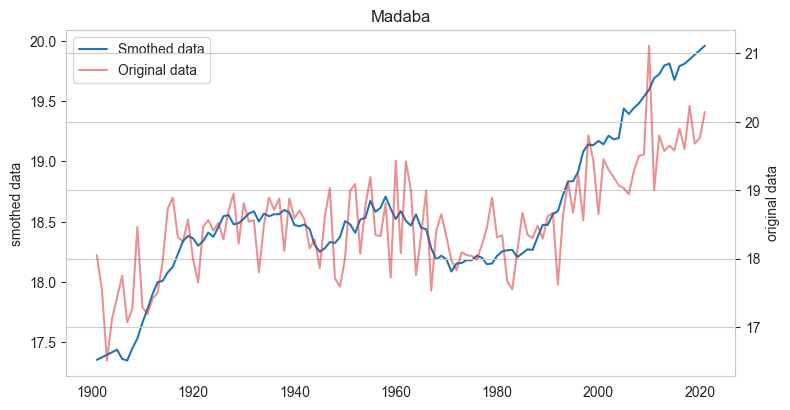

average annual change percentage = 0.1499813890567018%


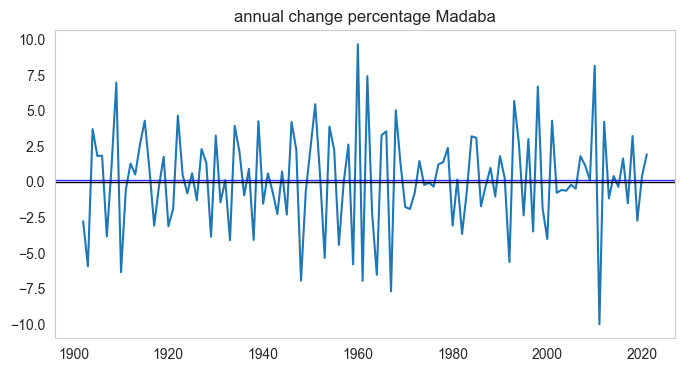

Mafraq
     year      value
0    1901  17.340909
1    1902  17.339818
2    1903  17.338727
3    1904  17.337636
4    1905  17.336545
..    ...        ...
116  2017  19.744909
117  2018  19.786727
118  2019  19.828545
119  2020  19.870364
120  2021  19.912182

[121 rows x 2 columns]
dalta value= 2.5712727272727207


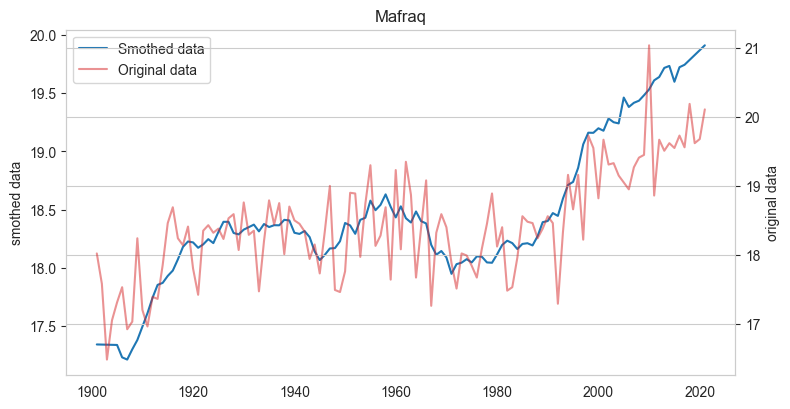

average annual change percentage = 0.15722850998184423%


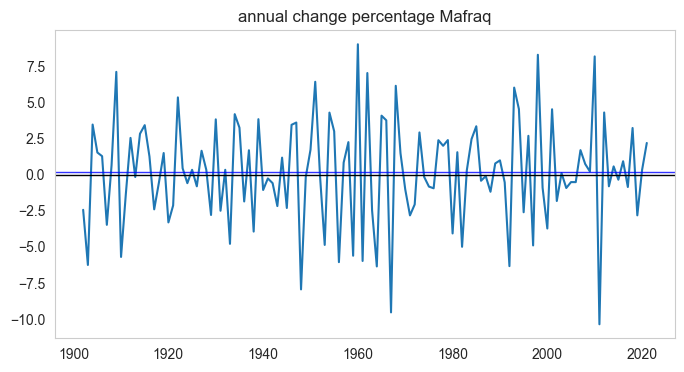

Zarqa
     year      value
0    1901  17.761273
1    1902  17.775212
2    1903  17.789152
3    1904  17.803091
4    1905  17.817030
..    ...        ...
116  2017  20.237091
117  2018  20.279273
118  2019  20.321455
119  2020  20.363636
120  2021  20.405818

[121 rows x 2 columns]
dalta value= 2.6445454545454545


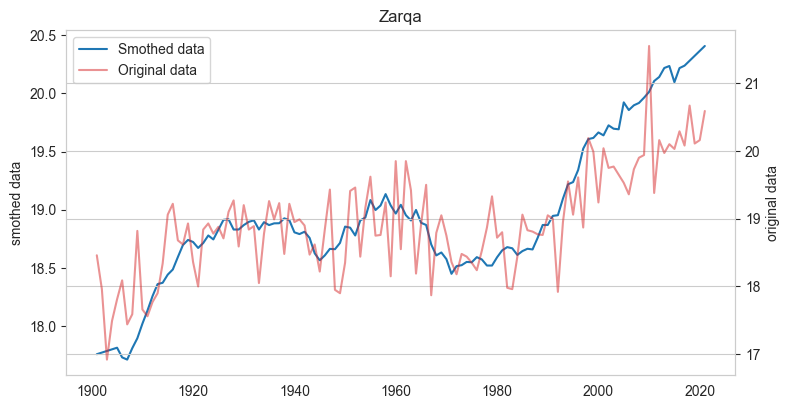

average annual change percentage = 0.14964693801184667%


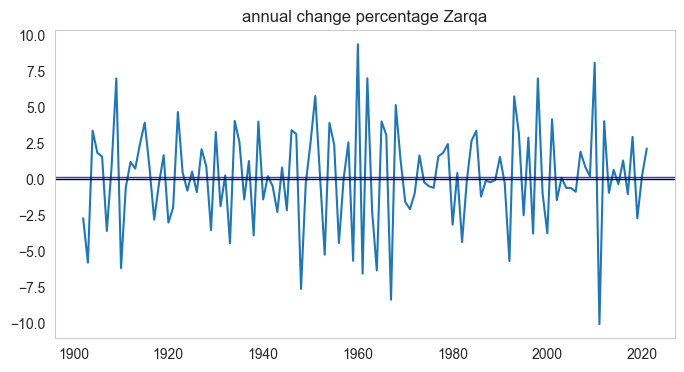

In [76]:
governates=jor_temp_df.columns[1:]
for wanted_governates in governates:
    data_smother_visualizer(jor_temp_df,wanted_governates)

    

## Jordan temps distribution for different time period

C:\Users\shake\AppData\Local\Temp\ipykernel_28420\532771824.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax=sns.kdeplot(jor_temp_df[start:end], fill=fill, x='Jordan',ax=ax,label=label)


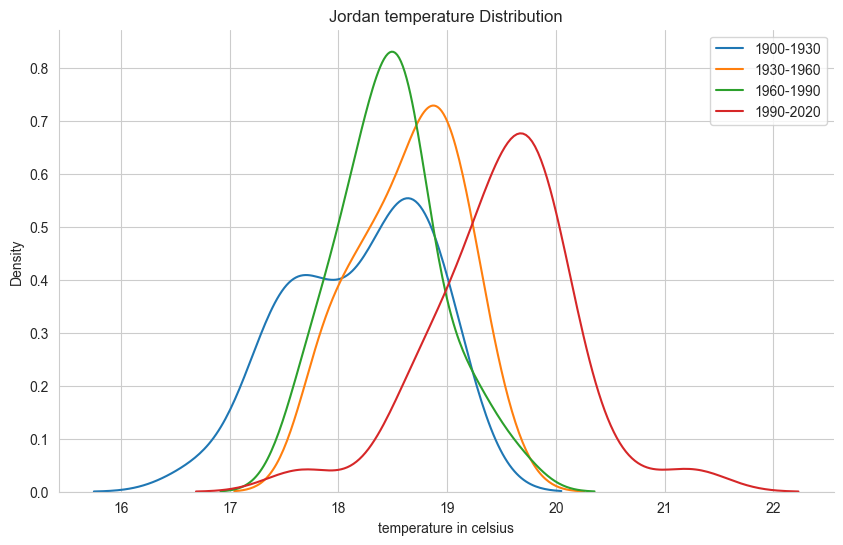

In [77]:
plt.subplots(figsize=(10, 6))
sns.set_style("whitegrid")
sns.despine()

fill=False

ax =sns.kdeplot(jor_temp_df[0:30], fill=fill,x='Jordan',label=f"1900-1930")

for start in range(30,130,30):
    end=start+30
    if end >= 100 and start>=100:
        label=f"20{start-100}-20{end-100}"
    elif end >= 100 and start<100:
        label=f"19{start}-20{end-100}"
    else:
        label=f"19{start}-19{end}"
    ax=sns.kdeplot(jor_temp_df[start:end], fill=fill, x='Jordan',ax=ax,label=label)
ax.set_title('Jordan temperature Distribution')
ax.set_xlabel("temperature in celsius")
ax.legend()
plt.show()

## visualizing Jordan temps over time 

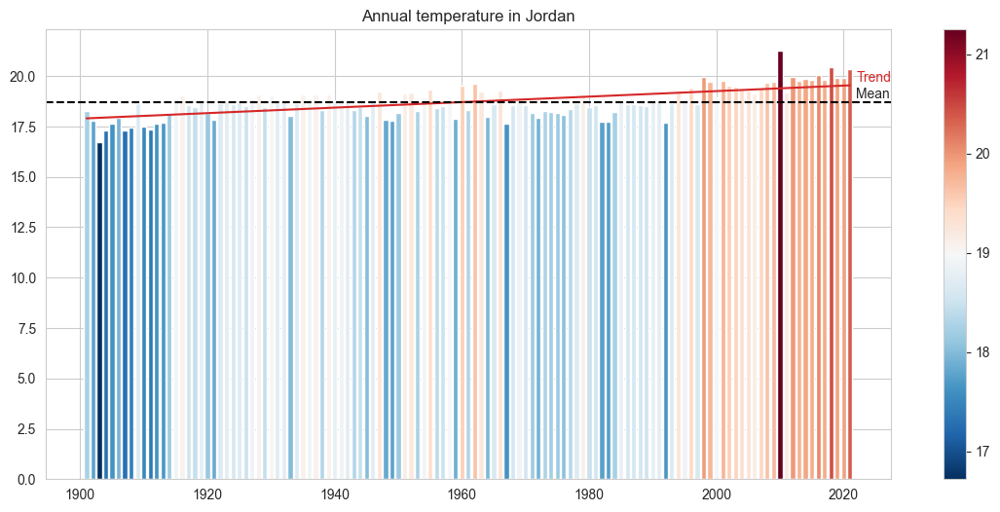

In [78]:
values = jor_temp_df['Jordan']
cmap = plt.cm.get_cmap('RdBu_r')

fig, ax = plt.subplots(figsize=(14,6))
bars = ax.bar(jor_temp_df['Year'].unique(), values, color=cmap((values - np.min(values)) / (np.max(values) - np.min(values))))
# ax.set_yticks([])
ax.set_title('Annual temperature in Jordan')
ax.plot(jor_temp_df['Year'],savgol_filter(jor_temp_df['Jordan'],121,1),color='tab:red')
ax.axhline(y=jor_temp_df['Jordan'].mean(), color='k', linestyle='--')
ax.annotate('Mean',(2022,jor_temp_df['Jordan'].mean()+0.2))
ax.annotate('Trend',(2022,jor_temp_df['Jordan'].mean()+1),color='tab:red')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=np.min(values), vmax=np.max(values)))
plt.colorbar(sm, ax=ax)
plt.show()


## co2 annual change percentage

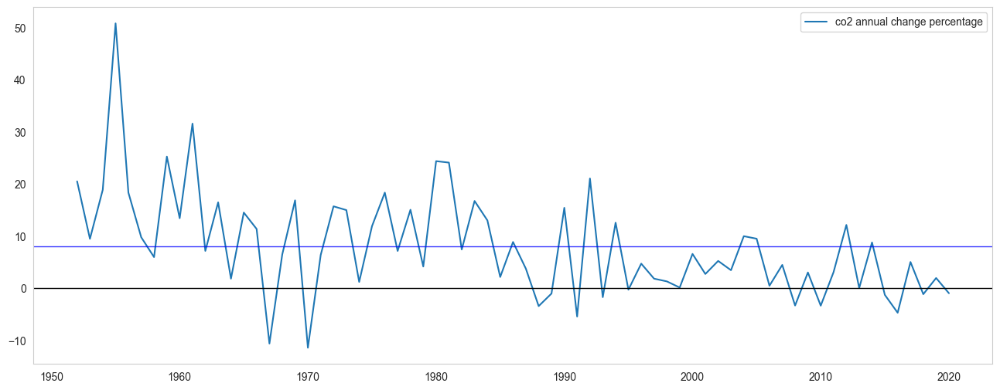

In [79]:
fig, ax = plt.subplots()
fig.set_figwidth(16)
fig.set_figheight(6)

ax.plot(co2_df['Year'],co2_df['co2_prc']*100,label='co2 annual change percentage')

ax.axhline(y=0, lw=1, color='k',alpha=1)
ax.axhline(y=co2_df['co2_prc'].mean()*100, lw=1, color='blue',alpha=.8)
plt.legend()


plt.grid()
plt.show()

## CO2 Cumulative Emissions and temperature for each month

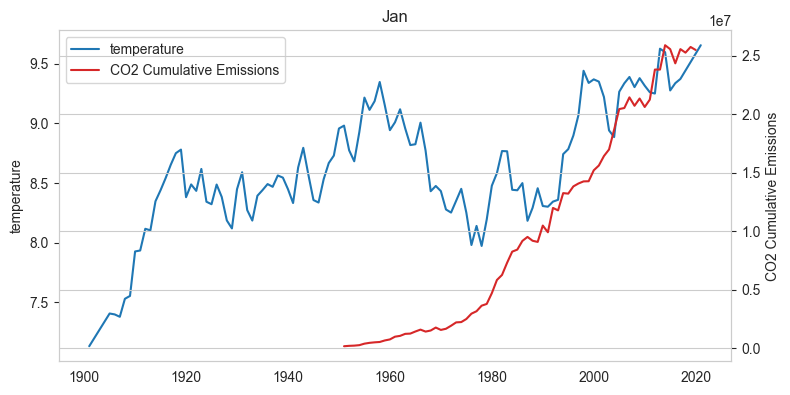

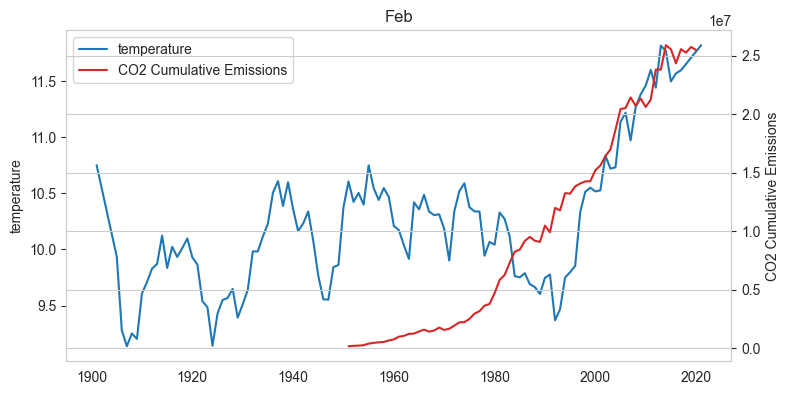

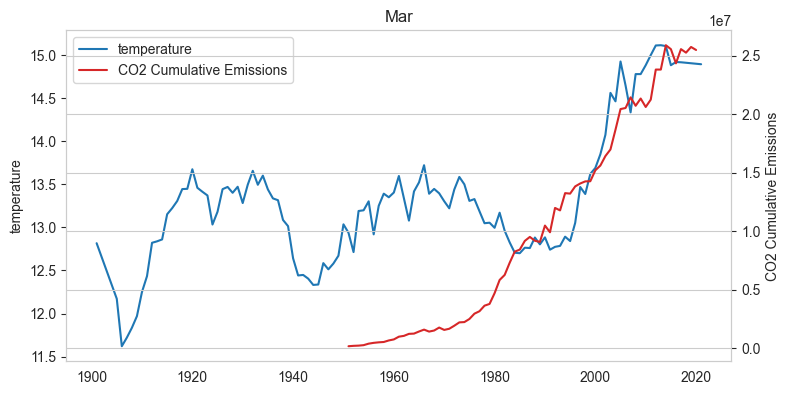

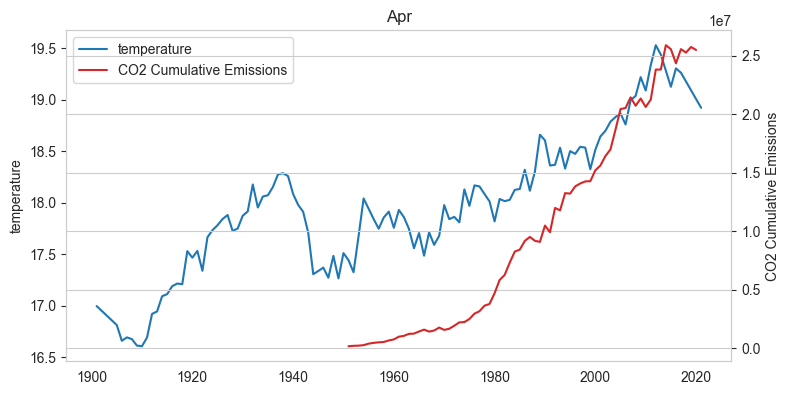

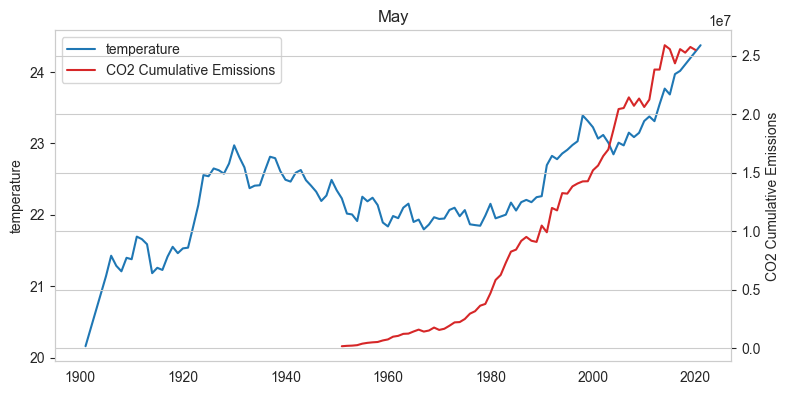

...

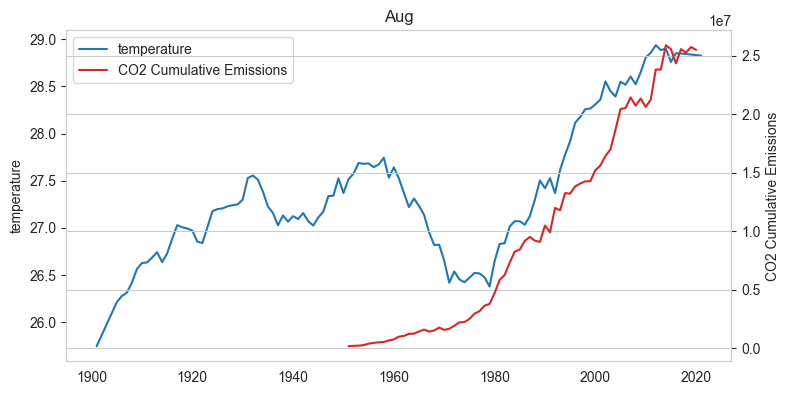

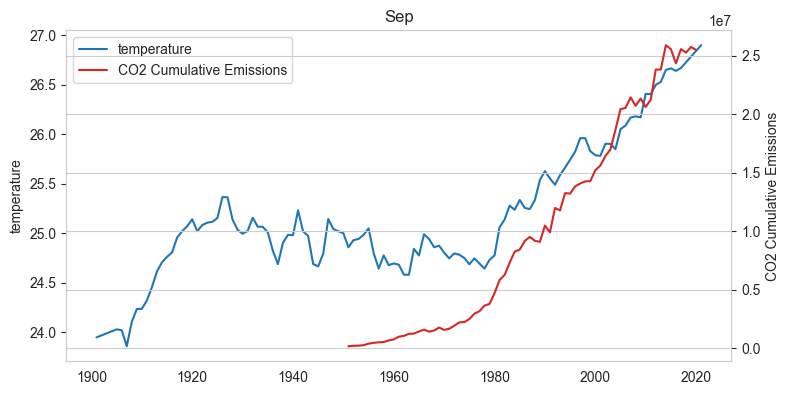

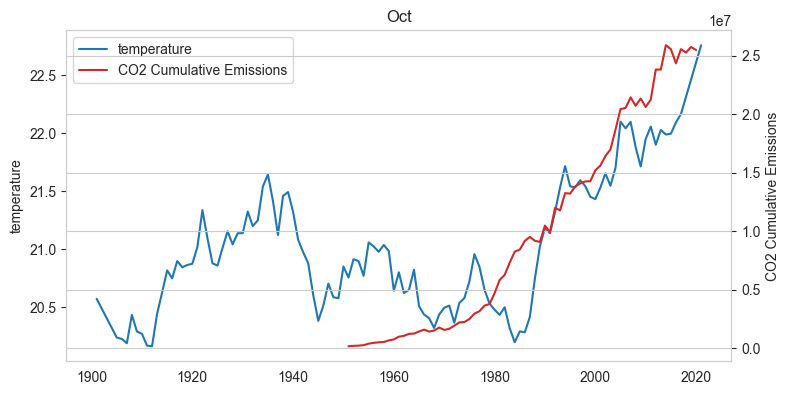

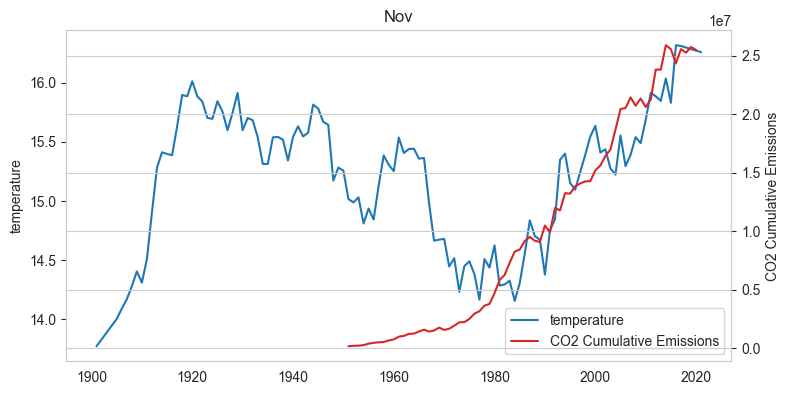

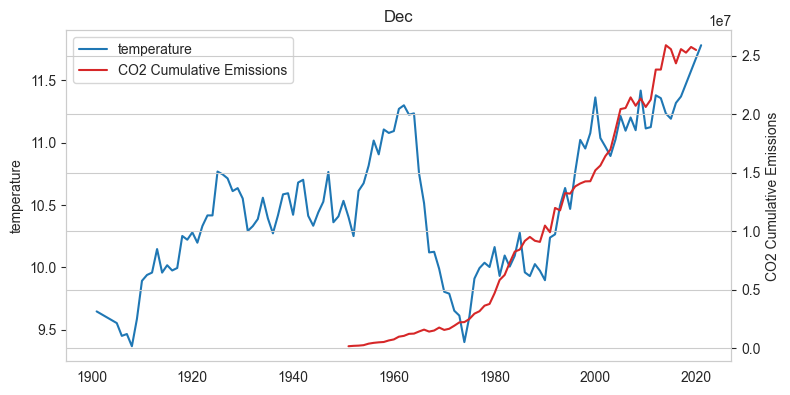

In [80]:
for wanted_month in monthss:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(df['Year'],df[f'{wanted_month}_smoothed'], color='tab:blue',label='temperature')
    ax1.set_ylabel('temperature')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2 Cumulative Emissions')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_month)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    
    ax1.legend(lns, labs, loc=0)

    plt.show()

## CO2 Cumulative Emissions and temperature for each governate

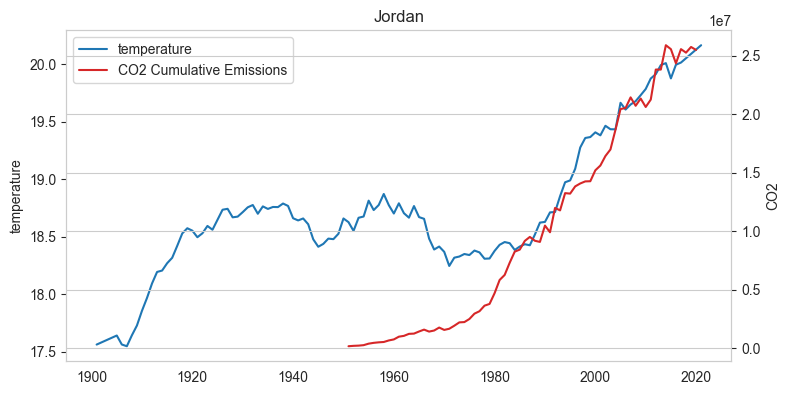

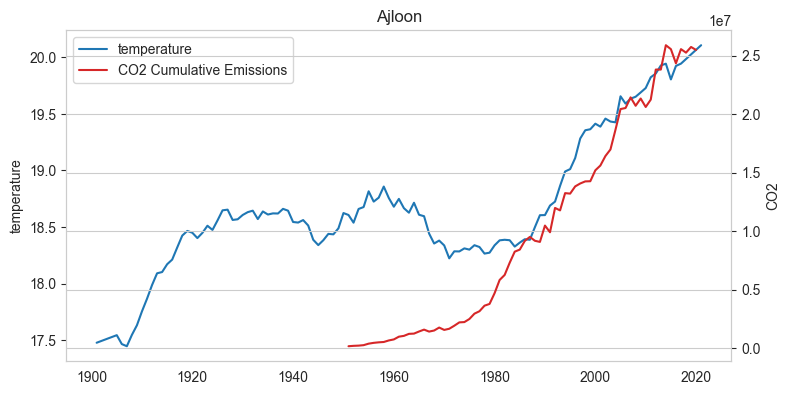

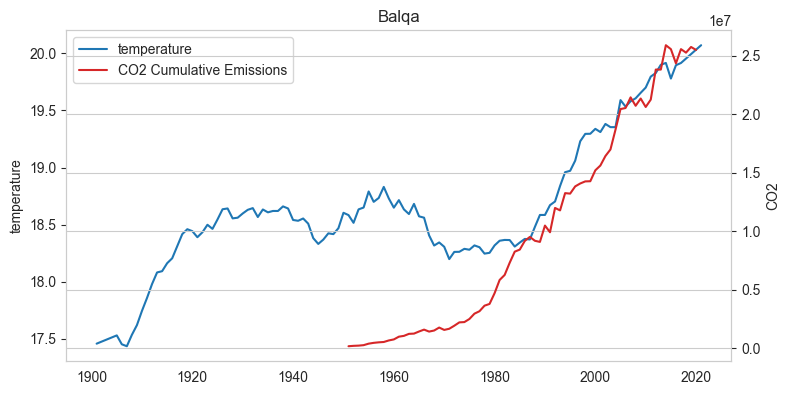

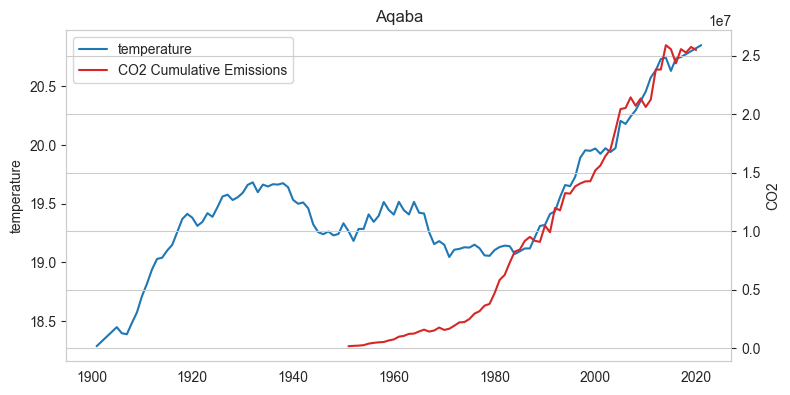

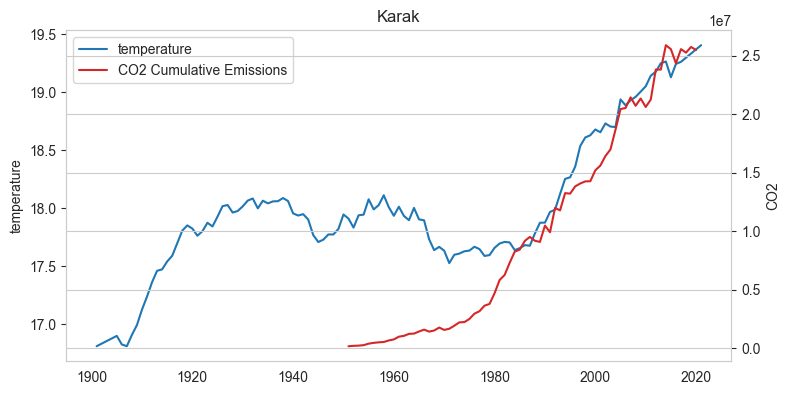

...

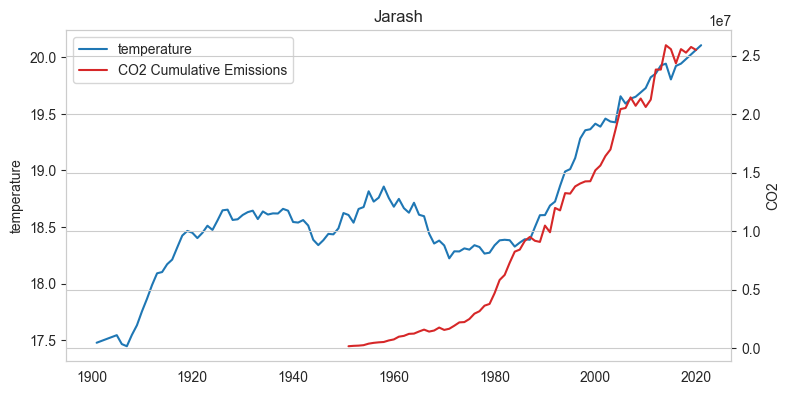

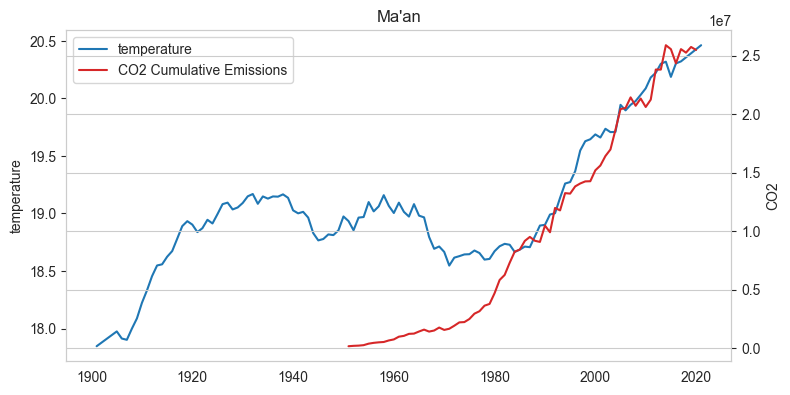

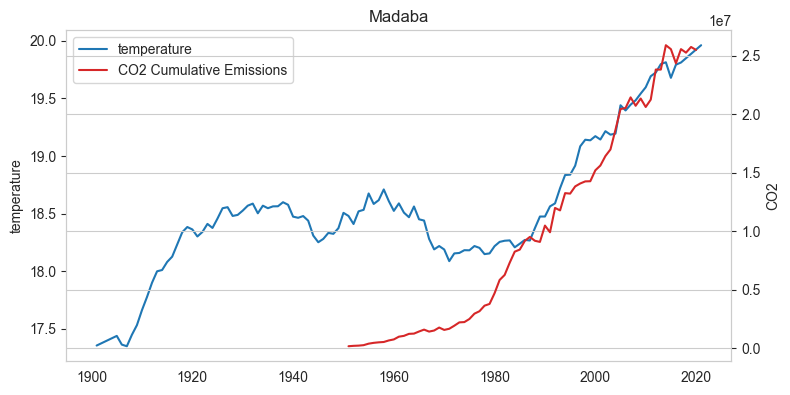

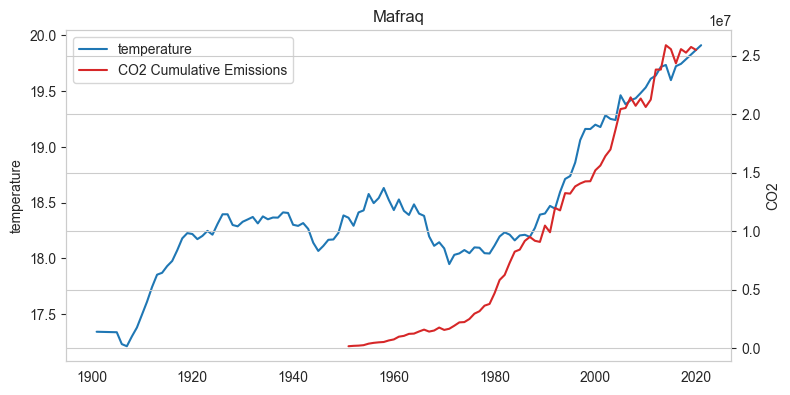

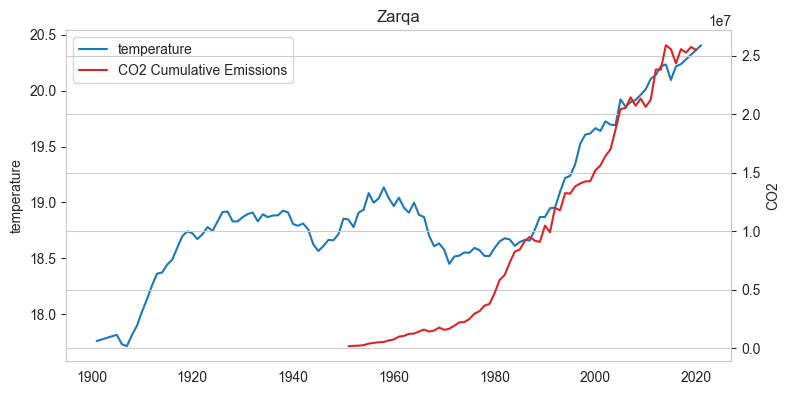

In [81]:
for wanted_governates in governates:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(jor_temp_df['Year'],jor_temp_df[f'{wanted_governates}_smoothed'], color='tab:blue',label='temperature')
    ax1.set_ylabel('temperature')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_governates)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    
    plt.show()

## data distribution for each governate

<Figure size 640x480 with 0 Axes>

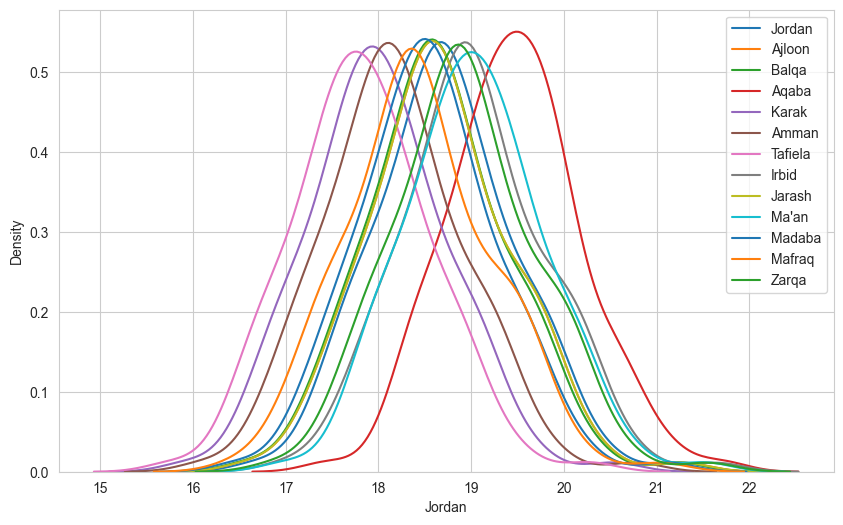

In [82]:
sns.set_style("whitegrid")
sns.despine()
    
plt.subplots(figsize=(10, 6))

ax =sns.kdeplot(jor_temp_df, x=governates[0],label=governates[0])
for month in governates[1:]:
    ax=sns.kdeplot(jor_temp_df, x=month,ax=ax,label=month)

ax.legend()

plt.show()

## CO2 Cumulative Emissions, temperature and Agricultural land 

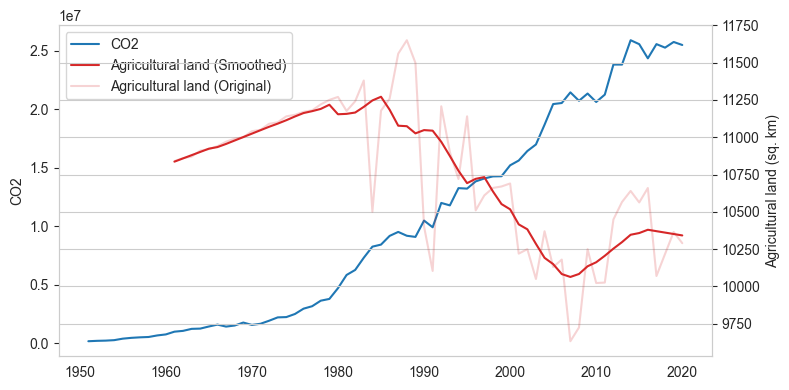

In [83]:
# jor_temp_df['Year']=pd.to_datetime(jor_temp_df['Year'])
new_values=savgol_filter(jor_temp_df['Jordan'],10,1)
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:blue',label='CO2')
ax1.set_ylabel('CO2')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (sq. km)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

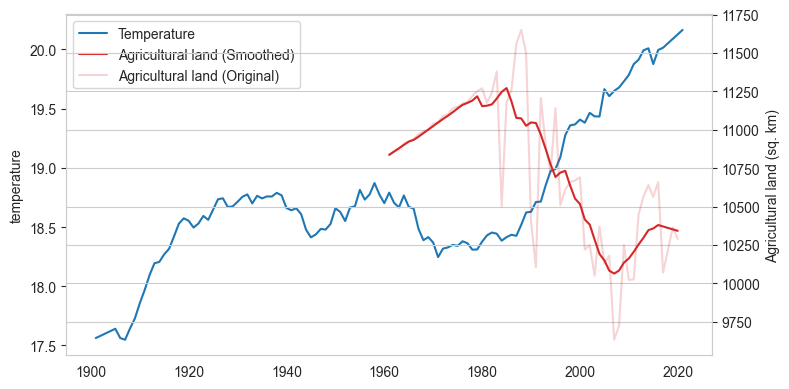

In [84]:
new_values=savgol_filter(jor_temp_df['Jordan'],10,1)
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(jor_temp_df['Year'],new_values, color='tab:blue',label='Temperature')
ax1.set_ylabel('temperature')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (sq. km)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

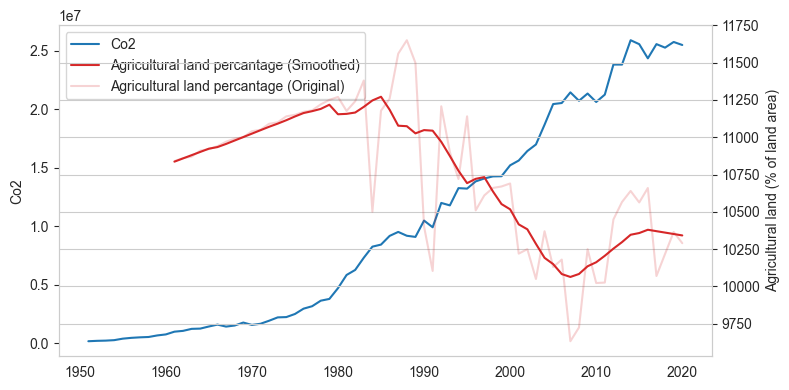

In [85]:
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:blue',label='Co2')
ax1.set_ylabel('Co2')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (% of land area)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land percantage (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land percantage (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

## visualizing the rain value for each month before and after smoothing

Jan
     year      value
0    1901  30.847455
1    1902  31.985212
2    1903  32.721606
3    1904  33.056636
4    1905  32.990303
..    ...        ...
116  2017  18.557333
117  2018  19.161273
118  2019  20.844909
119  2020  23.608242
120  2021  27.451273

[121 rows x 2 columns]
dalta value= -3.396181818181777


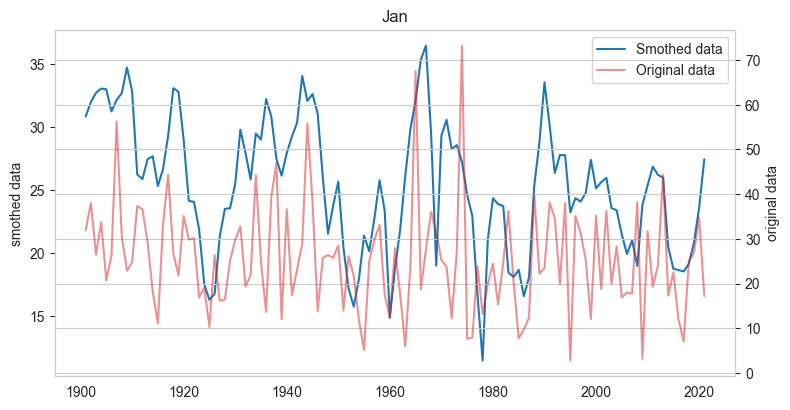

average annual change percentage = 37.39775463421993%


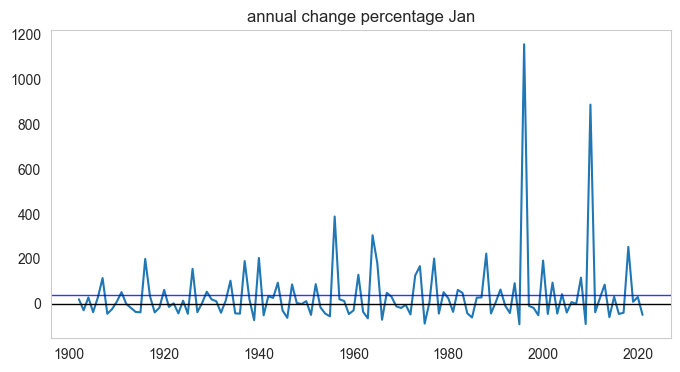

Feb
     year      value
0    1901   2.550636
1    1902  11.347909
2    1903  18.146318
3    1904  22.945864
4    1905  25.746545
..    ...        ...
116  2017  20.559152
117  2018  22.280818
118  2019  24.282636
119  2020  26.564606
120  2021  29.126727

[121 rows x 2 columns]
dalta value= 26.5760909090909


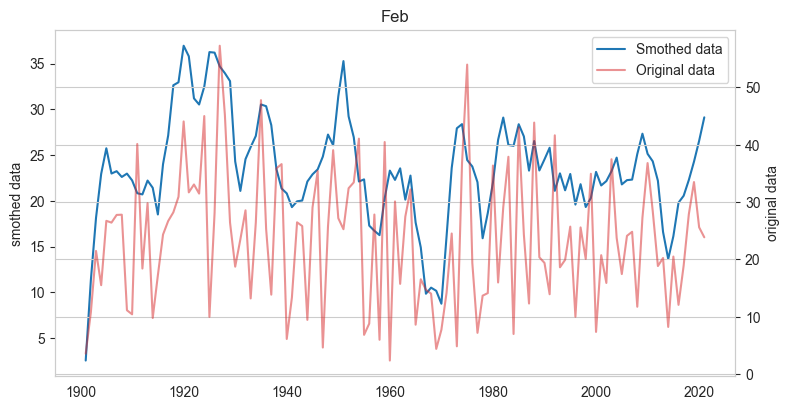

average annual change percentage = 48.31275016422206%


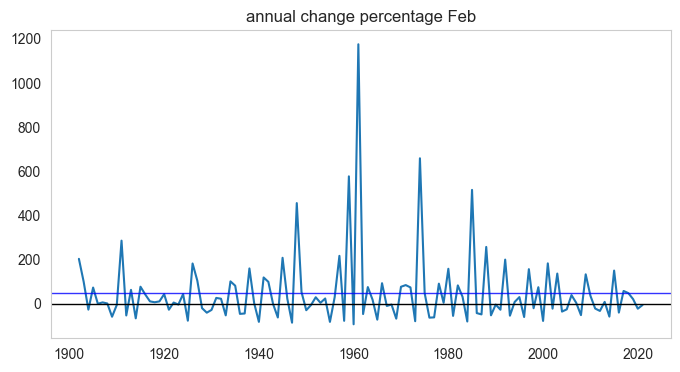

Mar
     year      value
0    1901  10.327636
1    1902  14.674061
2    1903  18.254273
3    1904  21.068273
4    1905  23.116061
..    ...        ...
116  2017  14.021758
117  2018  13.590864
118  2019  13.107924
119  2020  12.572939
120  2021  11.985909

[121 rows x 2 columns]
dalta value= 1.6582727272727418


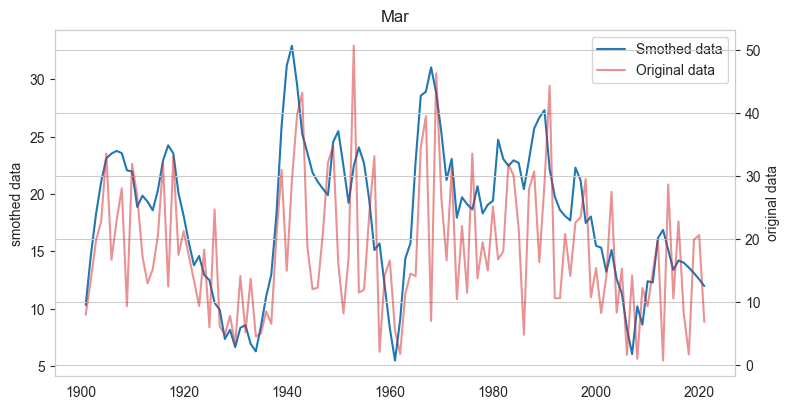

average annual change percentage = 91.1254953031579%


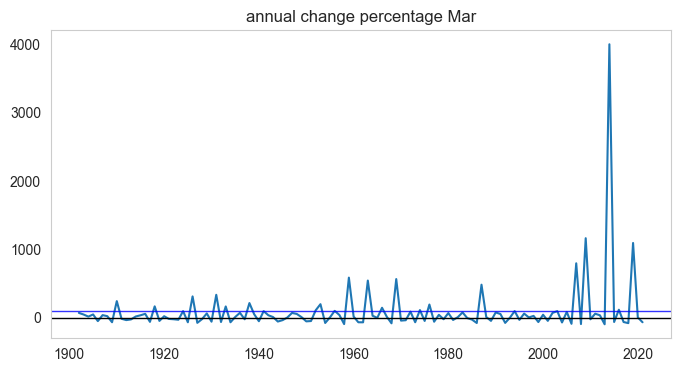

Apr
     year      value
0    1901   5.310364
1    1902   7.956000
2    1903  10.337242
3    1904  12.454091
4    1905  14.306545
..    ...        ...
116  2017  10.367879
117  2018  10.109318
118  2019   9.059167
119  2020   7.217424
120  2021   4.584091

[121 rows x 2 columns]
dalta value= -0.7262727272727432


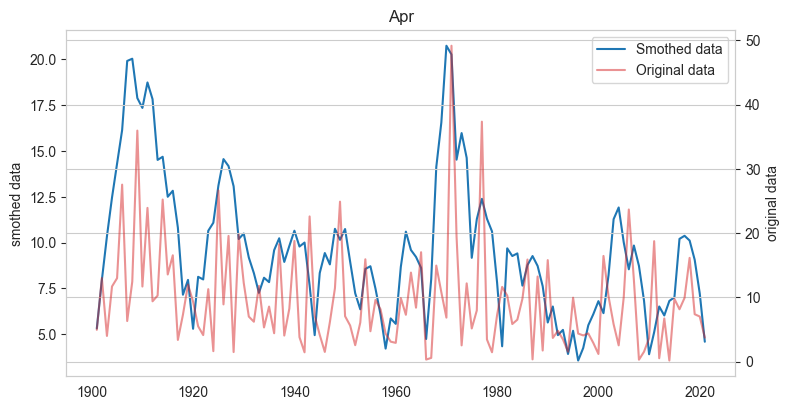

average annual change percentage = 207.49839859972155%


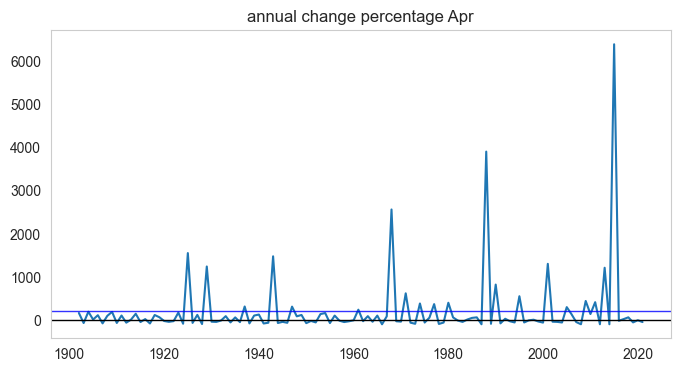

May
     year     value
0    1901  9.347727
1    1902  7.478030
2    1903  6.036742
3    1904  5.023864
4    1905  4.439394
..    ...       ...
116  2017  4.658061
117  2018  4.325682
118  2019  3.864136
119  2020  3.273424
120  2021  2.553545

[121 rows x 2 columns]
dalta value= -6.794181818181812


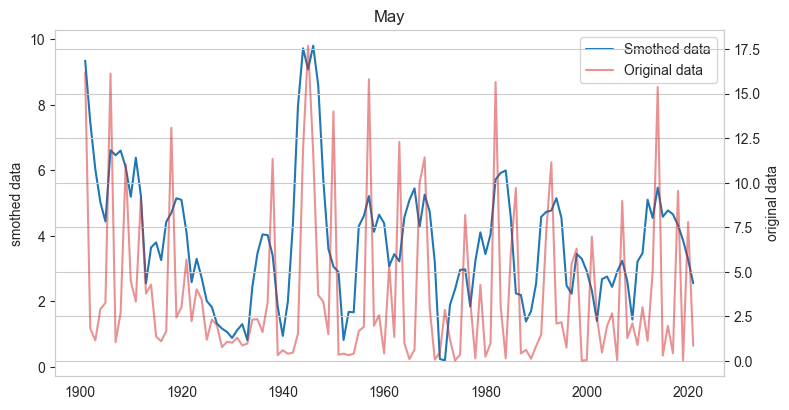

average annual change percentage = 679.4870842493974%


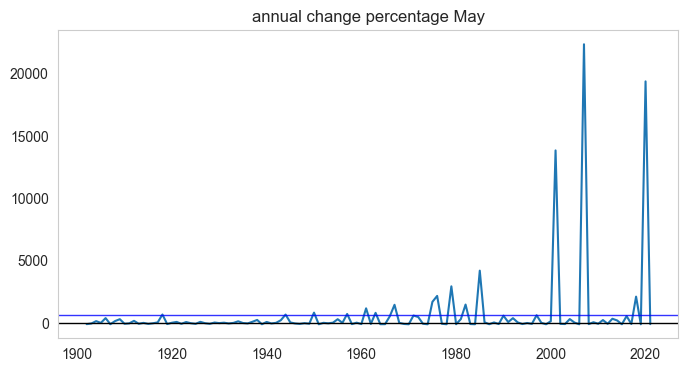

Jun
     year     value
0    1901  0.056364
1    1902  0.091879
2    1903  0.120879
3    1904  0.143364
4    1905  0.159333
..    ...       ...
116  2017  0.028909
117  2018  0.034364
118  2019  0.041333
119  2020  0.049818
120  2021  0.059818

[121 rows x 2 columns]
dalta value= 0.003454545454545481


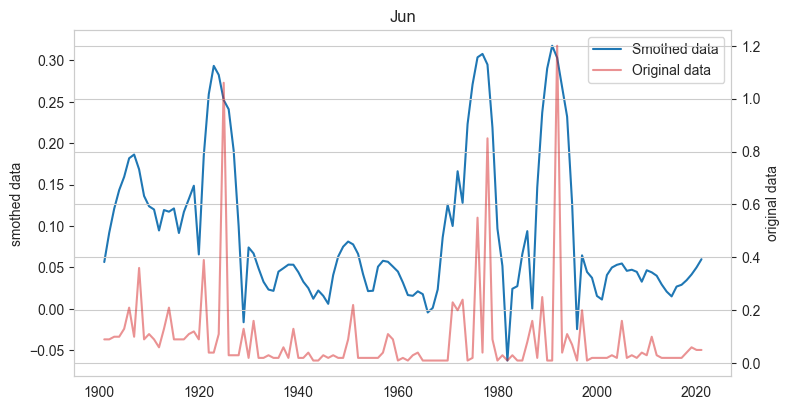

average annual change percentage = 228.14021060969014%


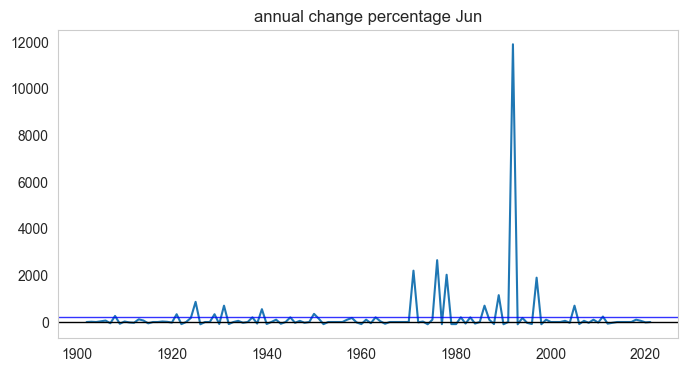

Jul
     year  value
0    1901   0.07
1    1902   0.07
2    1903   0.07
3    1904   0.07
4    1905   0.07
..    ...    ...
116  2017   0.07
117  2018   0.07
118  2019   0.07
119  2020   0.07
120  2021   0.07

[121 rows x 2 columns]
dalta value= 9.71445146547012e-17


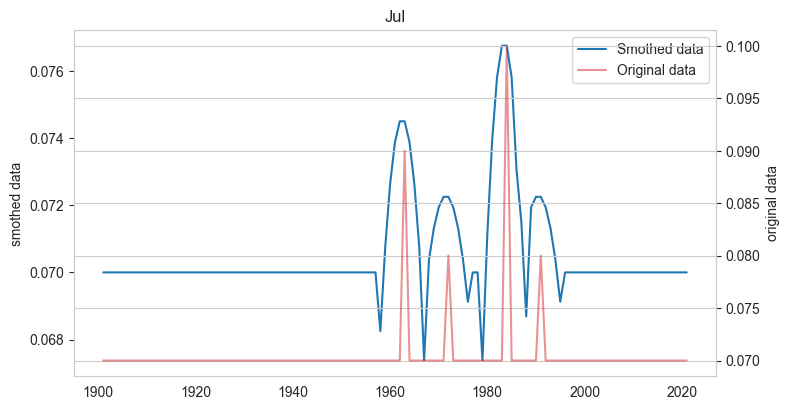

average annual change percentage = 0.18981481481481496%


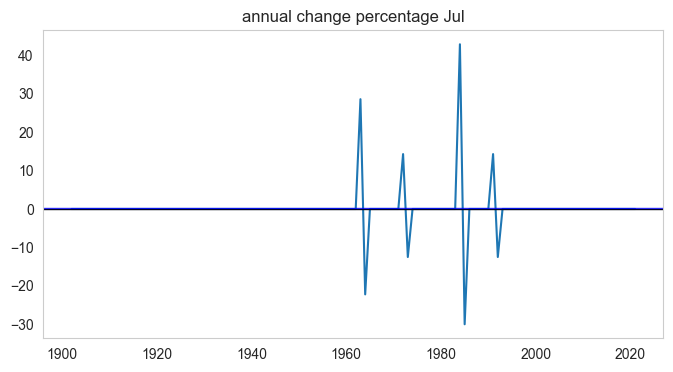

Aug
     year     value
0    1901  0.070000
1    1902  0.070000
2    1903  0.070000
3    1904  0.070000
4    1905  0.070000
..    ...       ...
116  2017  0.025455
117  2018  0.019909
118  2019  0.012091
119  2020  0.002000
120  2021 -0.010364

[121 rows x 2 columns]
dalta value= -0.0803636363636363


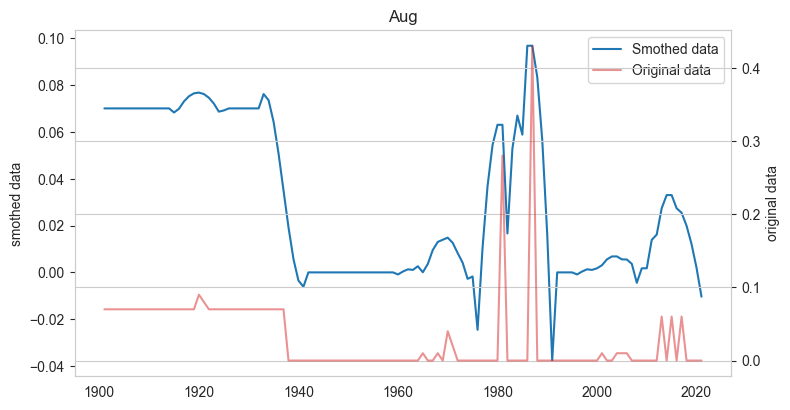

average annual change percentage = inf%


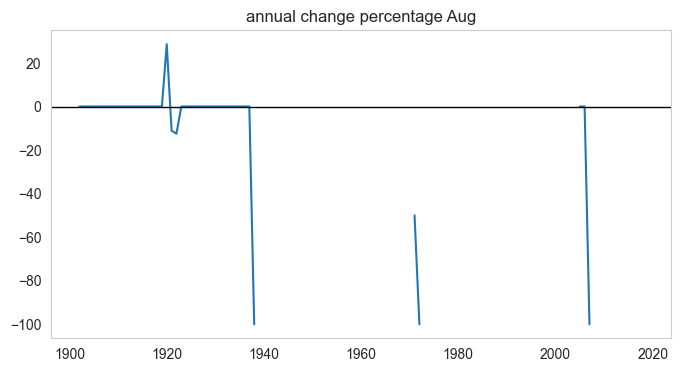

Sep
     year     value
0    1901  0.029818
1    1902  0.029152
2    1903  0.031667
3    1904  0.037364
4    1905  0.046242
..    ...       ...
116  2017  0.031515
117  2018  0.021455
118  2019  0.015939
119  2020  0.014970
120  2021  0.018545

[121 rows x 2 columns]
dalta value= -0.011272727272727042


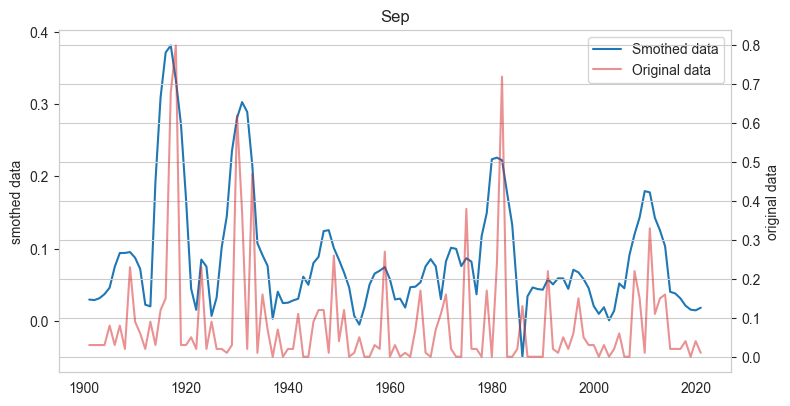

average annual change percentage = inf%


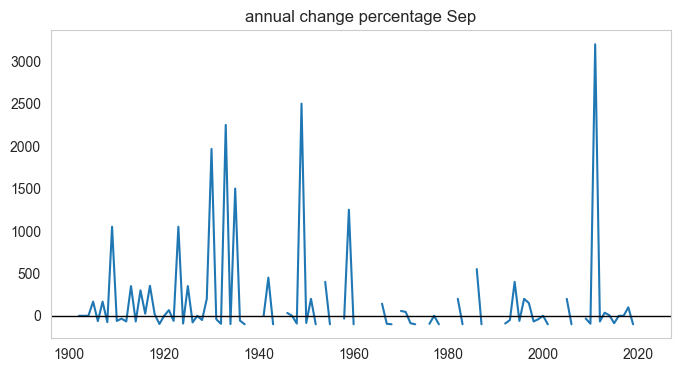

Oct
     year     value
0    1901  3.367000
1    1902  3.515000
2    1903  3.692167
3    1904  3.898500
4    1905  4.134000
..    ...       ...
116  2017  8.556788
117  2018  7.307909
118  2019  5.233424
119  2020  2.333333
120  2021 -1.392364

[121 rows x 2 columns]
dalta value= -4.759363636363656


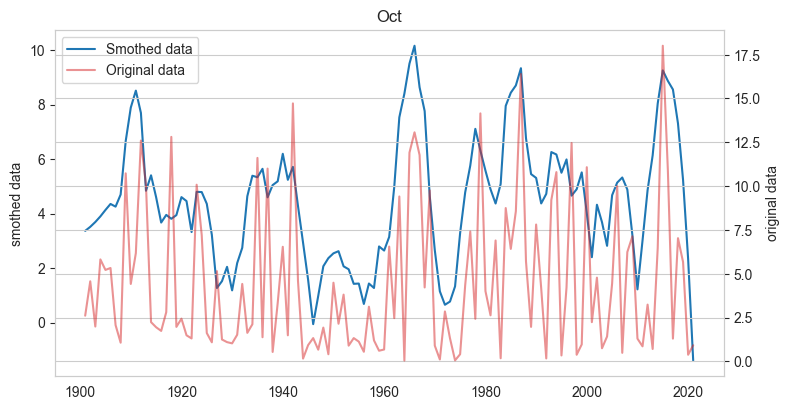

average annual change percentage = 422.8852058724354%


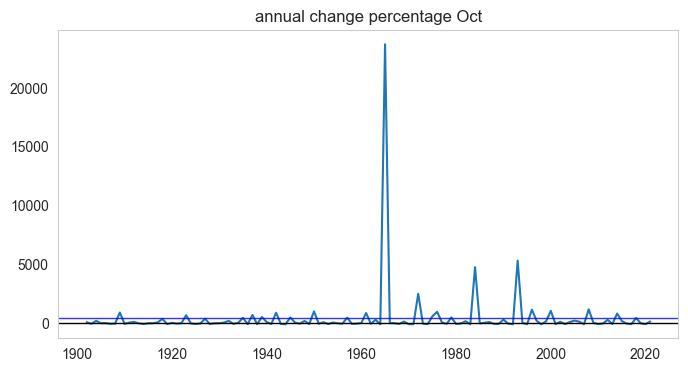

Nov
     year      value
0    1901  16.993182
1    1902  15.633545
2    1903  14.452924
3    1904  13.451318
4    1905  12.628727
..    ...        ...
116  2017   7.317212
117  2018   8.176682
118  2019  10.334712
119  2020  13.791303
120  2021  18.546455

[121 rows x 2 columns]
dalta value= 1.5532727272727662


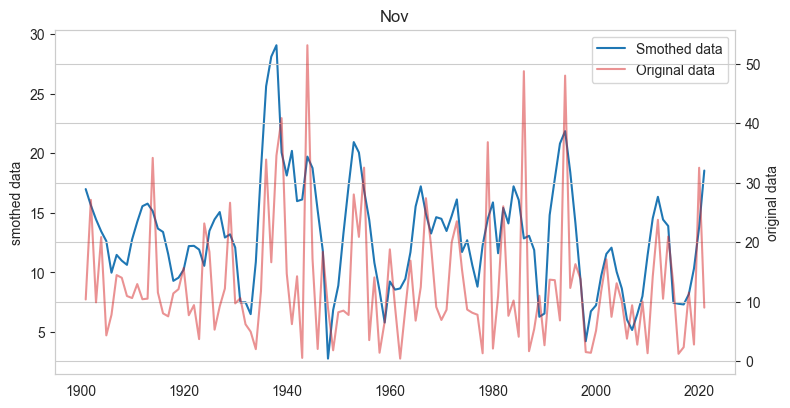

average annual change percentage = 198.0039584285516%


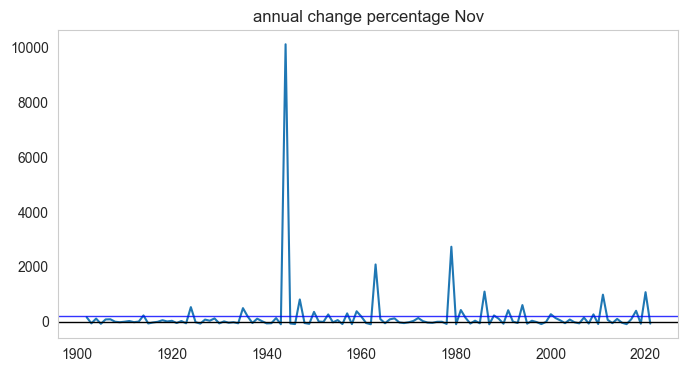

Dec
     year      value
0    1901  23.174273
1    1902  26.126091
2    1903  27.893288
3    1904  28.475864
4    1905  27.873818
..    ...        ...
116  2017  19.525455
117  2018  19.776773
118  2019  20.053470
119  2020  20.355545
120  2021  20.683000

[121 rows x 2 columns]
dalta value= -2.4912727272727153


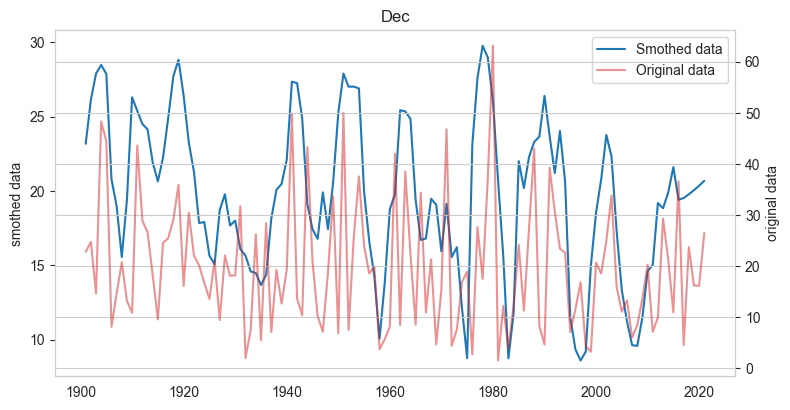

average annual change percentage = 66.31136314207379%


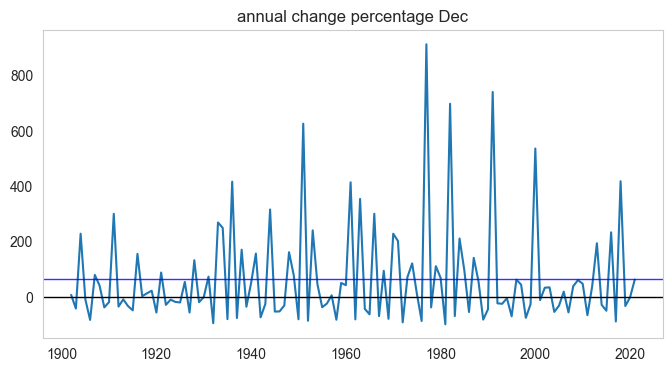

In [86]:
for wanted_month in monthss:    
    data_smother_visualizer(rain_df,wanted_month,2)

    

## rain distribution for different time period

C:\Users\shake\AppData\Local\Temp\ipykernel_28420\3923167333.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax=sns.kdeplot(rain_df[start:end], fill=fill, x='Jordan',ax=ax,label=label)


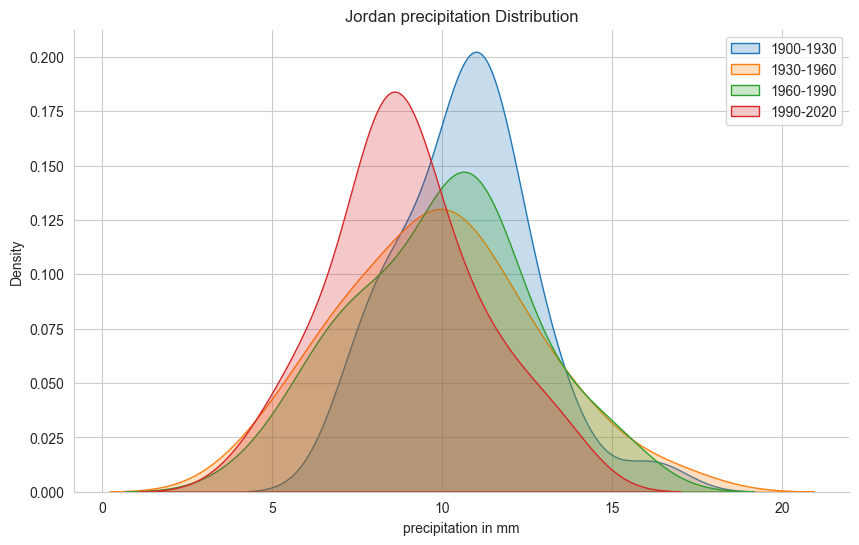

In [87]:
plt.subplots(figsize=(10, 6))
sns.set_style("whitegrid")
sns.despine()

fill=True

ax =sns.kdeplot(rain_df[0:30], fill=fill,x='Jordan',label=f"1900-1930")

for start in range(30,130,30):
    end=start+30
    if end >= 100 and start>=100:
        label=f"20{start-100}-20{end-100}"
    elif end >= 100 and start<100:
        label=f"19{start}-20{end-100}"
    else:
        label=f"19{start}-19{end}"
    ax=sns.kdeplot(rain_df[start:end], fill=fill, x='Jordan',ax=ax,label=label)
ax.set_title('Jordan precipitation Distribution')
ax.set_xlabel("precipitation in mm")
ax.legend()
plt.show()

## visualizing Jordan precipitation over time 

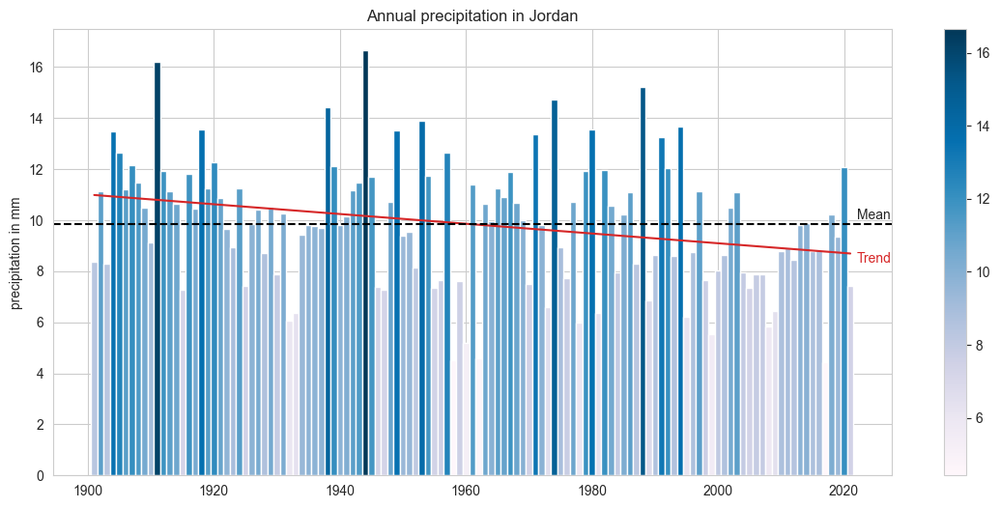

In [88]:
values = rain_df['Jordan']
cmap = plt.cm.get_cmap('PuBu')

fig, ax = plt.subplots(figsize=(14,6))
bars = ax.bar(rain_df['Year'].unique(), values, color=cmap((values - np.min(values)) / (np.max(values) - np.min(values))),width =1,align = 'center')
# ax.set_yticks([])
ax.set_ylabel('precipitation in mm')
ax.set_title('Annual precipitation in Jordan')
ax.plot(rain_df['Year'],savgol_filter(rain_df['Jordan'],121,1),color='tab:red')
ax.axhline(y=rain_df['Jordan'].mean(), color='k', linestyle='--')
ax.annotate('Mean',(2022,rain_df['Jordan'].mean()+0.2))
ax.annotate('Trend',(2022,rain_df['Jordan'].mean()-1.5),color='tab:red')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=np.min(values), vmax=np.max(values)))
plt.colorbar(sm, ax=ax)
plt.show()


## CO2 Cumulative Emissions and rain value for each month

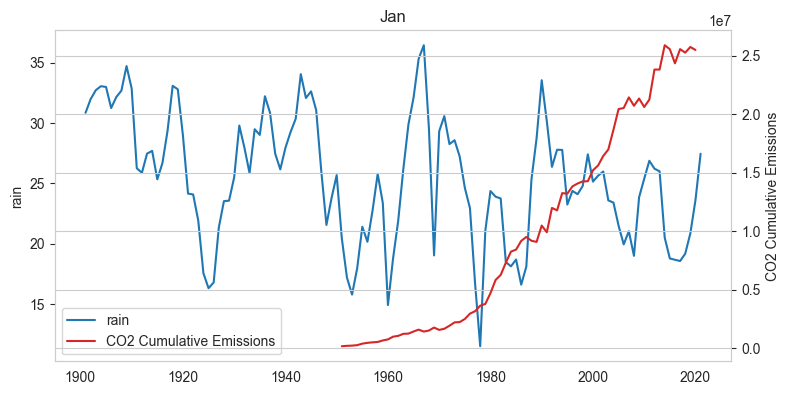

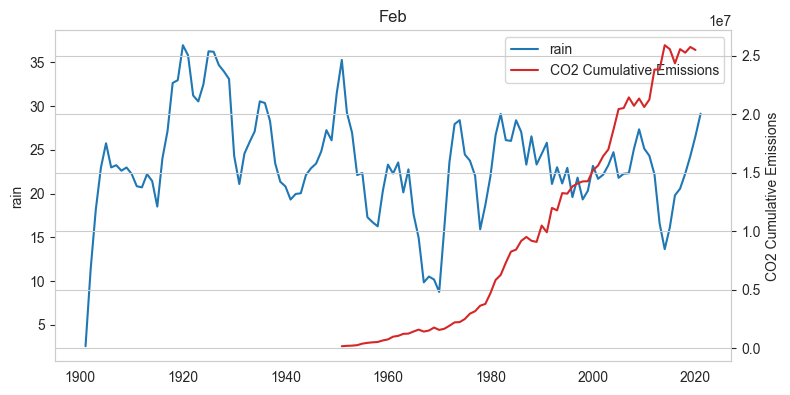

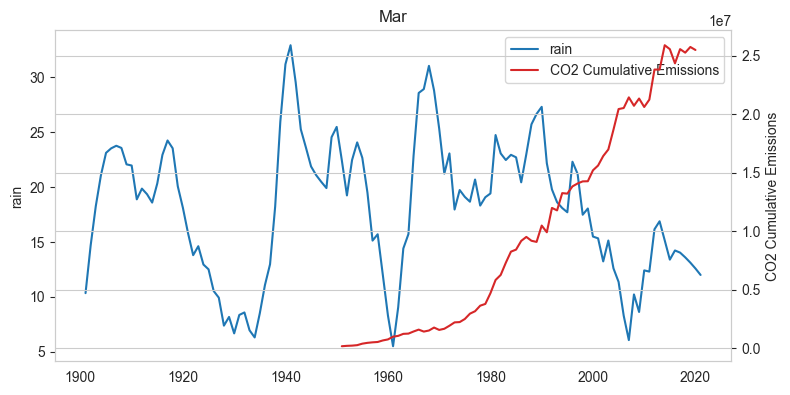

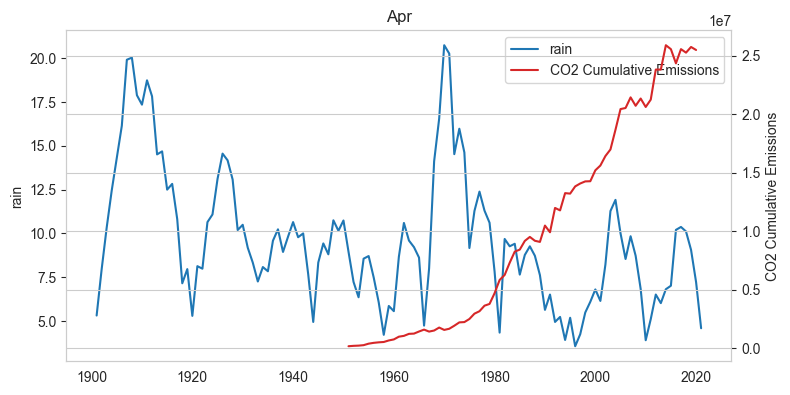

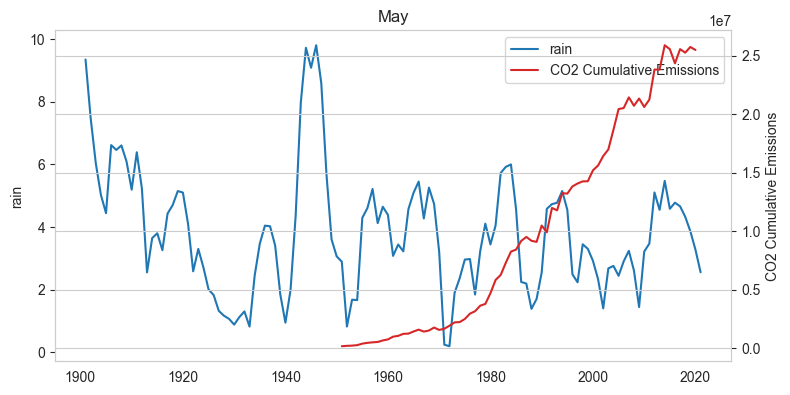

...

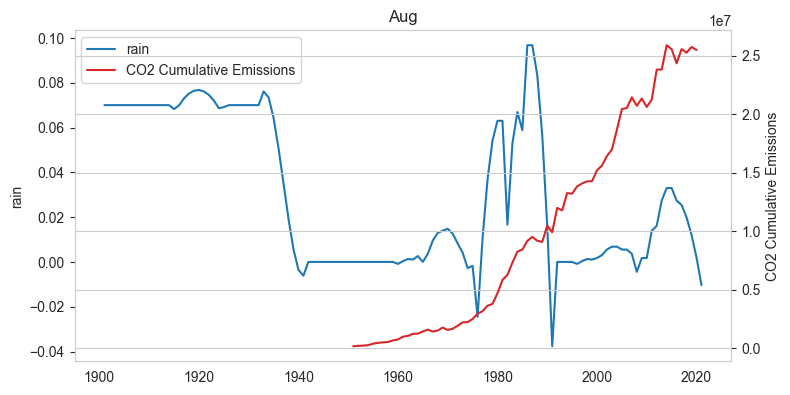

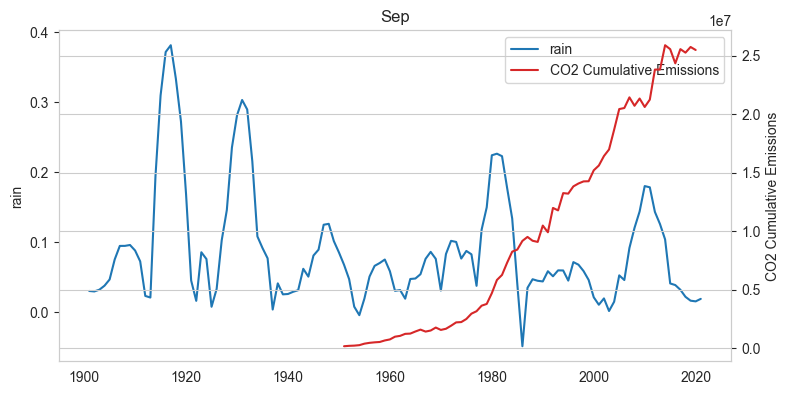

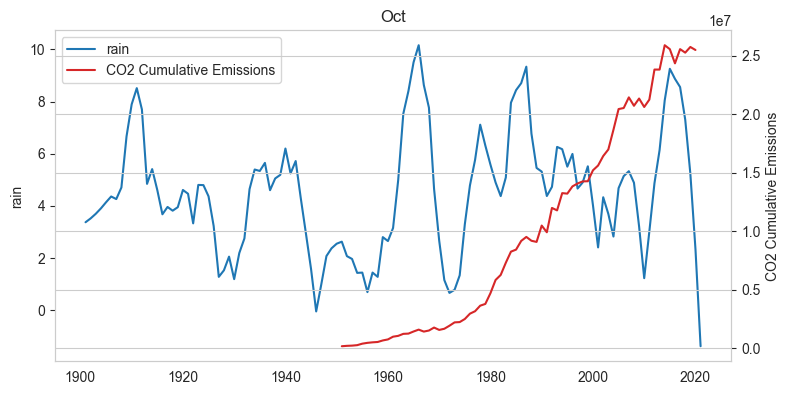

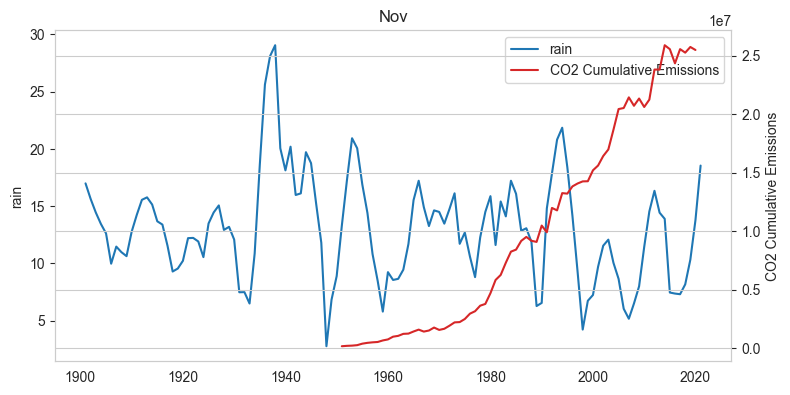

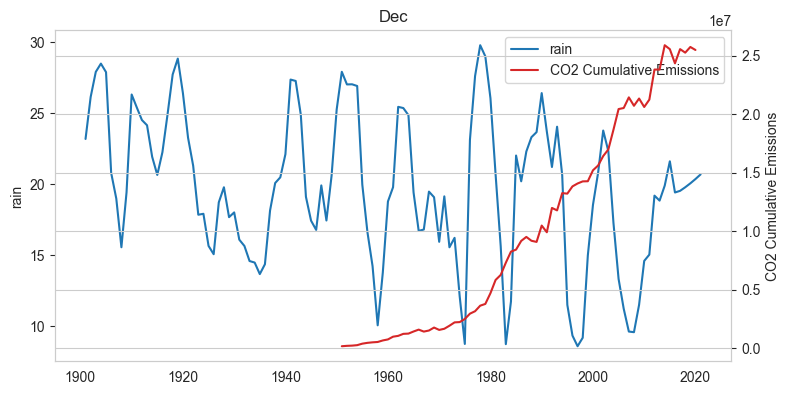

In [89]:
for wanted_month in monthss:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(rain_df['Year'],rain_df[f'{wanted_month}_smoothed'], color='tab:blue',label='rain')
    ax1.set_ylabel('rain')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2 Cumulative Emissions')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_month)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    
    ax1.legend(lns, labs, loc=0)

    plt.show()

## Monthly Climatology of Temperature & rain for all years

In [90]:
mean_monthly_temp=df.iloc[:,:13].drop('Year',axis=1).mean()
mean_monthly_rain=rain_df.iloc[:,:13].drop('Year',axis=1).mean()


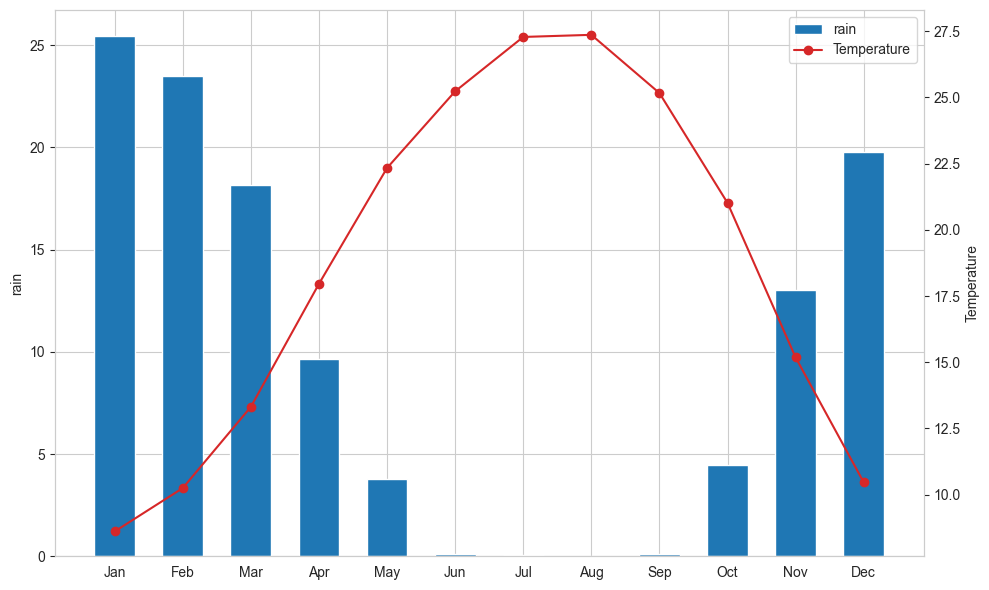

In [91]:
fig, ax1 = plt.subplots()
fig.set_figwidth(10)
fig.set_figheight(6)

plot1=ax1.bar(mean_monthly_rain.index,mean_monthly_rain, color='tab:blue',label="rain",width=0.6)
ax1.set_ylabel('rain')  



ax2 = ax1.twinx()
ax2.set_ylabel('Temperature')  
plot2=ax2.plot(mean_monthly_temp.index,mean_monthly_temp, color='tab:red',label='Temperature',marker='o')

lns = [plot1]+plot2
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)
fig.tight_layout()
plt.grid(axis='y')
plt.show()

## Monthly Climatology of Temperature & rain for different time period


In [92]:
test=pd.DataFrame()
for month in monthss:
    fortest=take_range(df,month,20)
    test['Year']=fortest['year']
    test[month]=fortest['value']

test2=pd.DataFrame()
for month in monthss:
    fortest=take_range(rain_df,month,20)
    test2['Year']=fortest['year']
    test2[month]=fortest['value']


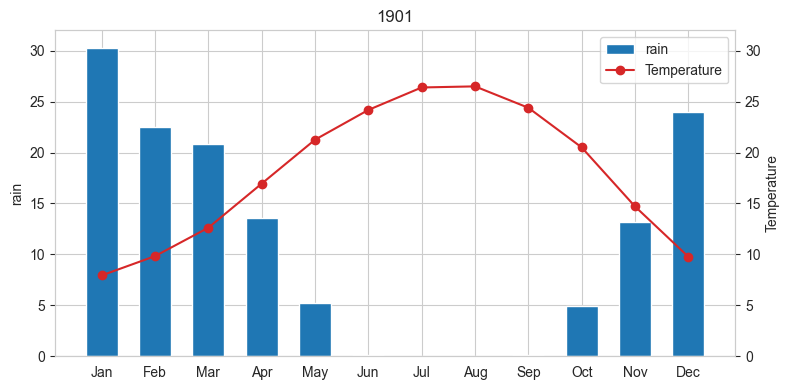

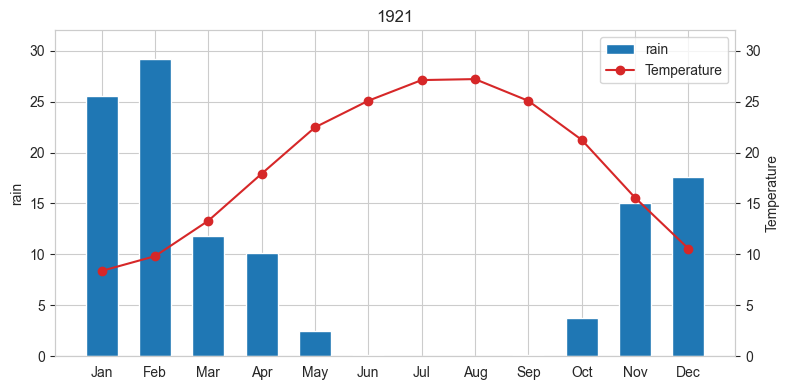

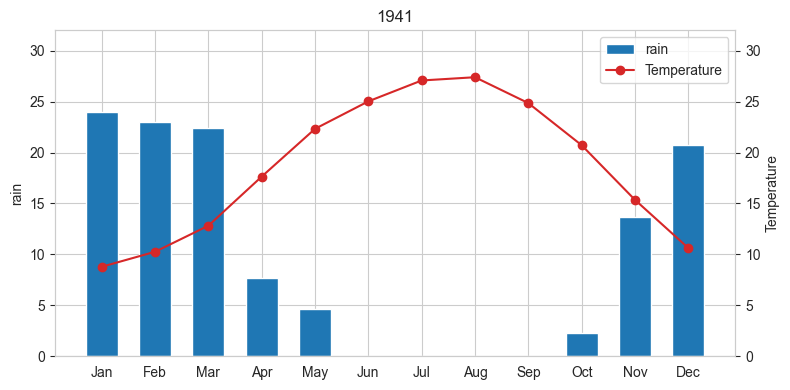

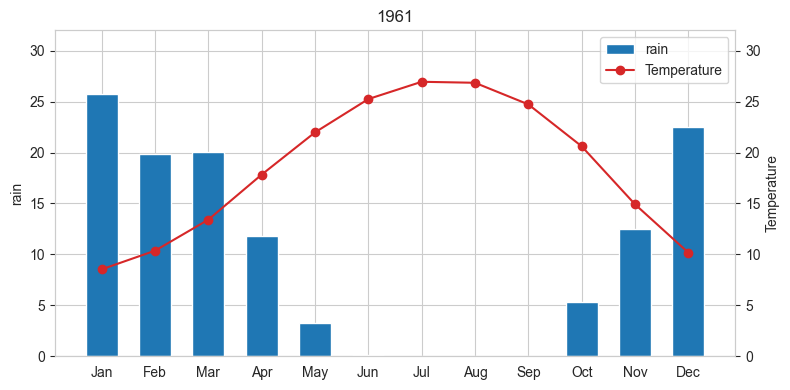

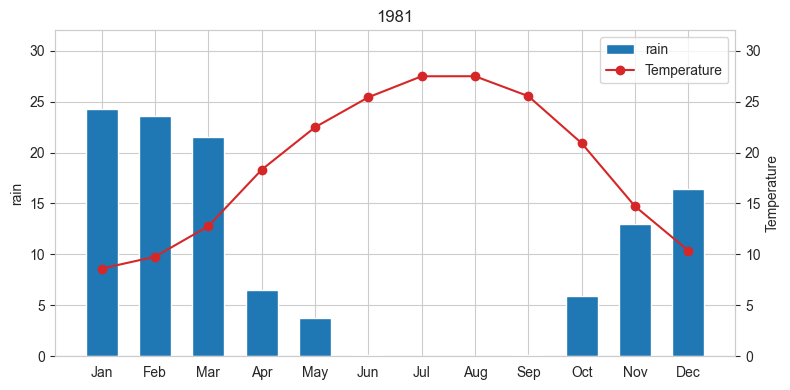

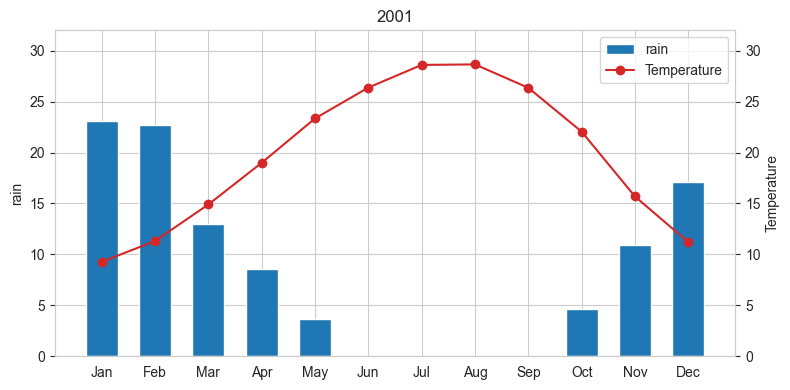

In [93]:
for i,year in zip(range(len(test)),test['Year']):
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    data=test2[test2['Year']==year].drop('Year',axis=1).T

    plot1=ax1.bar(data.index,data[i], color='tab:blue',label="rain",width=0.6)
    ax1.set_title(year)
    ax1.set_ylabel('rain')  
    ax1.set_ylim(0,32)
 

    ax2 = ax1.twinx()

    data=test[test['Year']==year].drop('Year',axis=1).T

    plot2=ax2.plot(data.index,data[i], color='tab:red',label='Temperature',marker='o')
    ax2.set_ylabel('Temperature')  
    ax2.set_ylim(0,32)

    lns = [plot1]+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    
    fig.tight_layout()
    plt.grid(axis='y')
    plt.show()


## CO2 Cumulative Emissions vs Electricity consumption

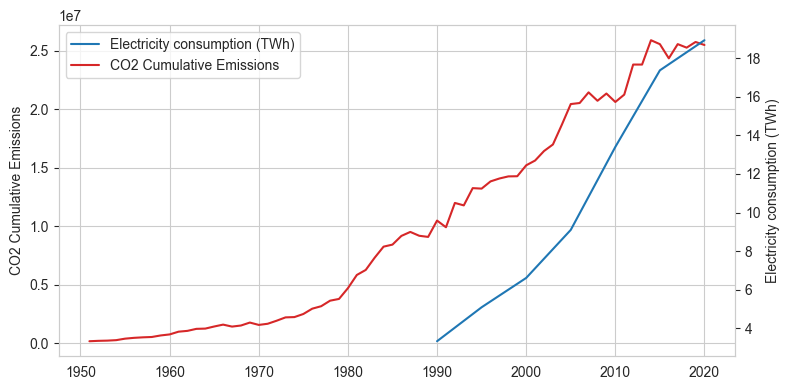

In [94]:
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)

ax1.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax1.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

ax2 = ax1.twinx()

plot1=ax2.plot(elec['Year'],elec['Electricity consumption'], color='tab:blue',label='Electricity consumption (TWh)')
ax2.set_ylabel('Electricity consumption (TWh)')  
fig.tight_layout()
lns = plot1+plot2
labs = [l.get_label() for l in lns]

ax1.legend(lns, labs, loc=0)
plt.grid()

plt.show()

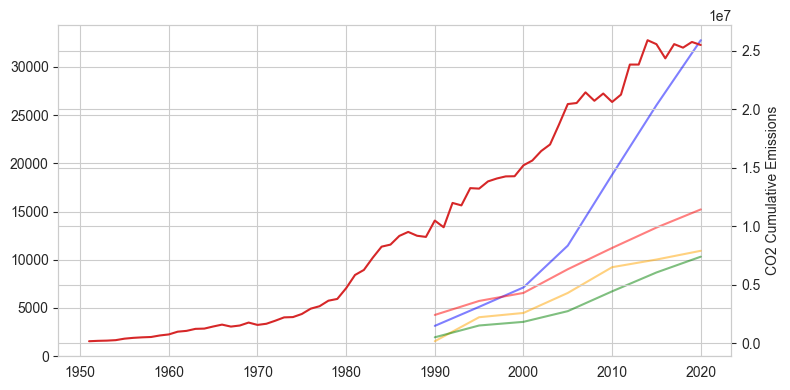

In [95]:
fig, ax1 = plt.subplots(figsize=(8,4))

ax1.plot(elec_by_sector['Year'],elec_by_sector['Residential'], color='blue', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Industry'], color='red', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Commercial and public services'], color='orange', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Agriculture / forestry'], color='green', alpha=0.5)
ax2 = ax1.twinx()
ax2.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions (TWh)')

fig.tight_layout()

plt.show()

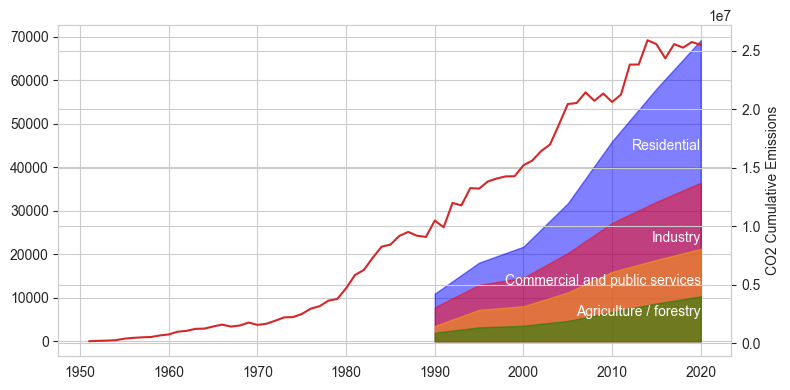

In [96]:
Residential_value=elec_by_sector['Residential']+elec_by_sector['Industry']+elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Industry_value= elec_by_sector['Industry']+elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Commercial_value =elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Agriculture_value=elec_by_sector['Agriculture / forestry']
fig, ax1 = plt.subplots(figsize=(8,4))

ax1.fill_between(elec_by_sector['Year'], 0,Residential_value , color='blue', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0, Industry_value, color='red', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0,Commercial_value, color='orange', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0, Agriculture_value, color='green', alpha=0.5)
for i,value in zip(['Industry','Residential','Commercial and public services','Agriculture / forestry'],[Industry_value,Residential_value,Commercial_value,Agriculture_value]):
    y_pos=max(value)*0.65
    x_pos=2020
    plt.text(x_pos, y_pos, i, ha='right',va='center', color='white')
ax2 = ax1.twinx()
ax2.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions (TWh)')

fig.tight_layout()

plt.show()

## extreme weather events 

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean       8.607769
std        1.267007
min        5.830000
25%        7.710000
50%        8.620000
75%        9.540000
max       11.890000
Name: Jan, dtype: float64
[1925]
[1937]
[1983]
[1992]
t0=84
t1=32
t2=4
t3=1
tot=121


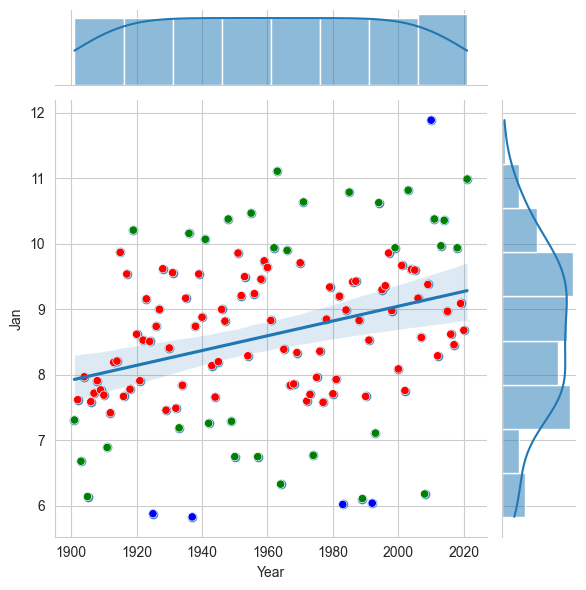

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      10.246860
std        1.506871
min        6.350000
25%        9.310000
50%       10.310000
75%       11.280000
max       13.550000
Name: Feb, dtype: float64
[1905]
[1911]
[1955]
[2010]
[2018]
t0=82
t1=33
t2=5
t3=1
tot=121


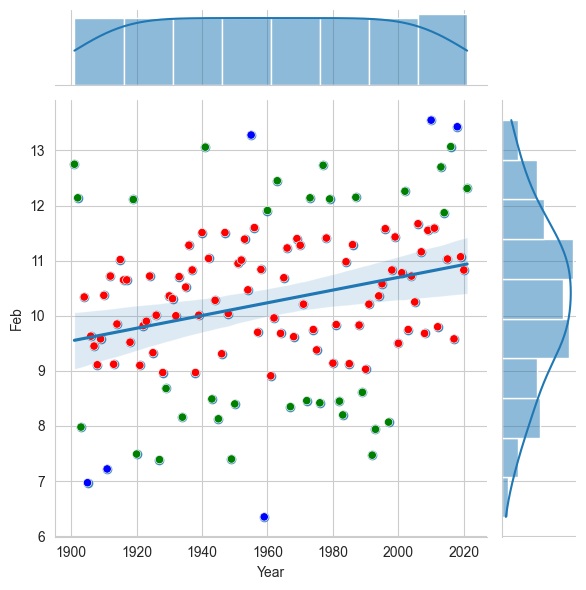

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      13.314793
std        1.622410
min        9.770000
25%       12.340000
50%       13.320000
75%       14.410000
max       17.390000
Name: Mar, dtype: float64
[1910]
[2001]
[2008]
[2010]
t0=84
t1=32
t2=4
t3=1
tot=121


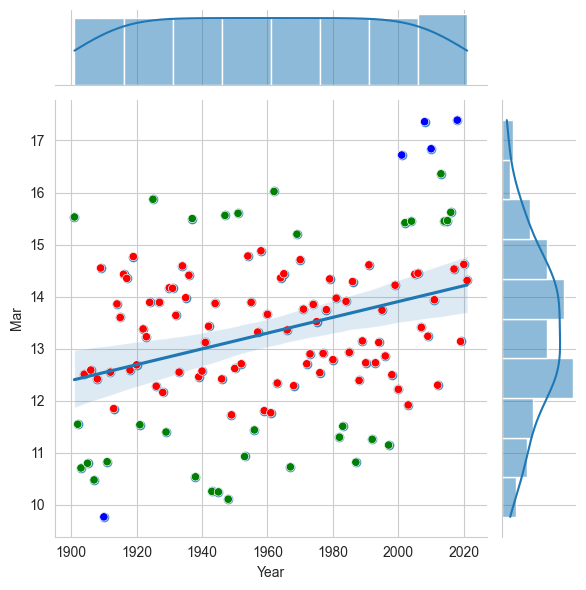

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      17.961653
std        1.312355
min       14.540000
25%       17.040000
50%       17.920000
75%       18.750000
max       21.000000
Name: Apr, dtype: float64
[1914]
[1933]
[1943]
[2008]
[2016]
t0=85
t1=30
t2=5
t3=1
tot=121


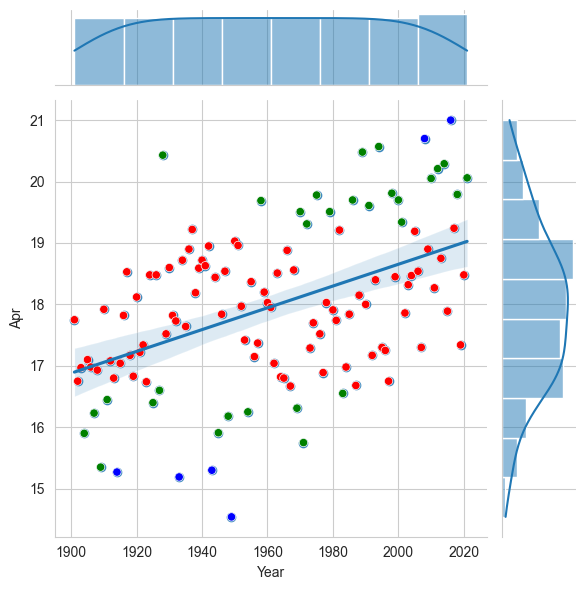

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      22.337355
std        1.261098
min       19.610000
25%       21.400000
50%       22.080000
75%       23.330000
max       25.240000
Name: May, dtype: float64
[1901]
[2003]
[2021]
t0=85
t1=33
t2=3
t3=0
tot=121


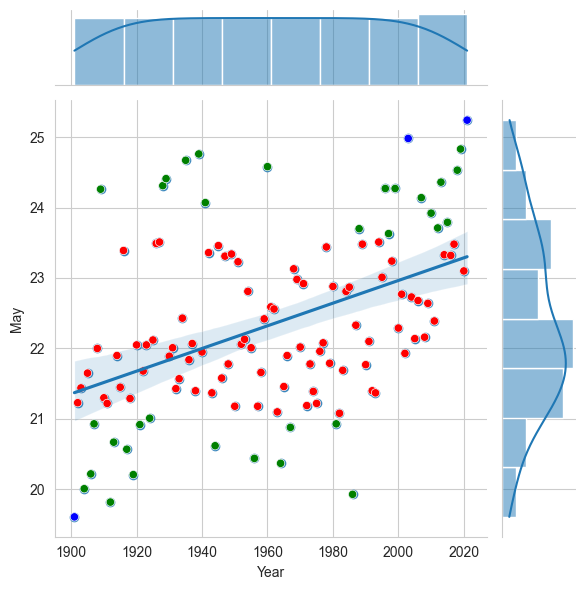

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      25.232975
std        1.016888
min       22.710000
25%       24.590000
50%       25.120000
75%       25.960000
max       27.550000
Name: Jun, dtype: float64
[1902]
[1903]
[1904]
[2012]
[2016]
[2019]
t0=79
t1=36
t2=6
t3=0
tot=121


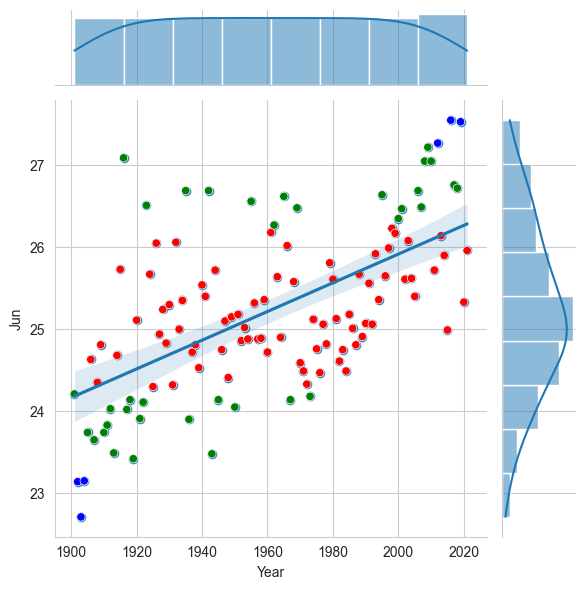

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      27.287025
std        0.982111
min       24.410000
25%       26.640000
50%       27.240000
75%       27.890000
max       29.710000
Name: Jul, dtype: float64
[1904]
[2000]
[2012]
[2017]
t0=81
t1=35
t2=4
t3=1
tot=121


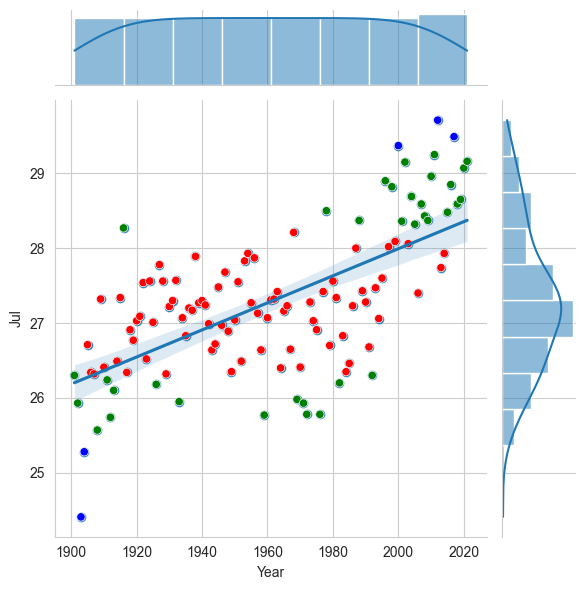

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      27.367025
std        1.026870
min       25.300000
25%       26.570000
50%       27.300000
75%       28.110000
max       29.970000
Name: Aug, dtype: float64
[1976]
[1998]
[2015]
t0=80
t1=37
t2=3
t3=1
tot=121


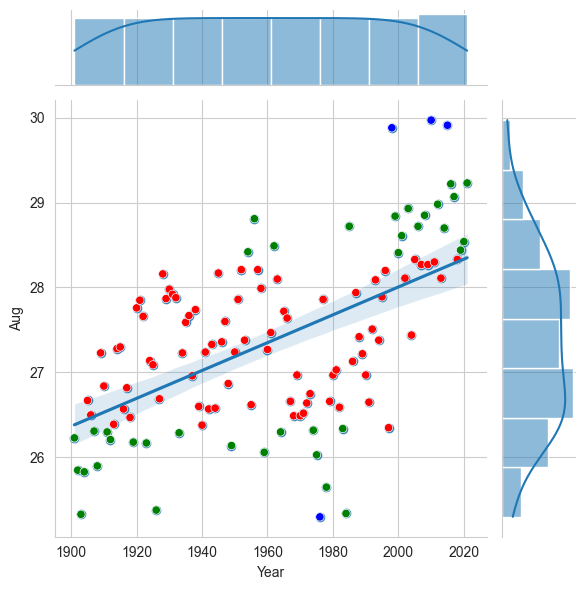

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      25.168264
std        1.041260
min       22.570000
25%       24.490000
50%       25.190000
75%       25.750000
max       27.910000
Name: Sep, dtype: float64
[1903]
[1949]
[1952]
[2010]
t0=87
t1=28
t2=4
t3=2
tot=121


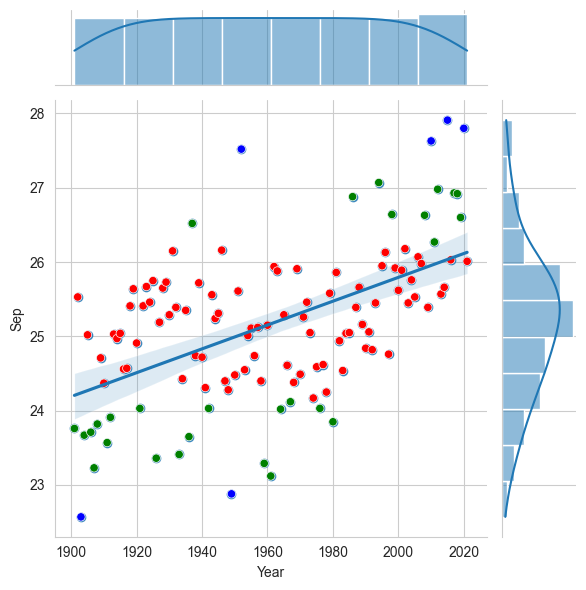

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      21.019504
std        1.210810
min       18.610000
25%       20.080000
50%       20.930000
75%       21.890000
max       23.940000
Name: Oct, dtype: float64
[1994]
[2010]
[2020]
t0=79
t1=39
t2=3
t3=0
tot=121


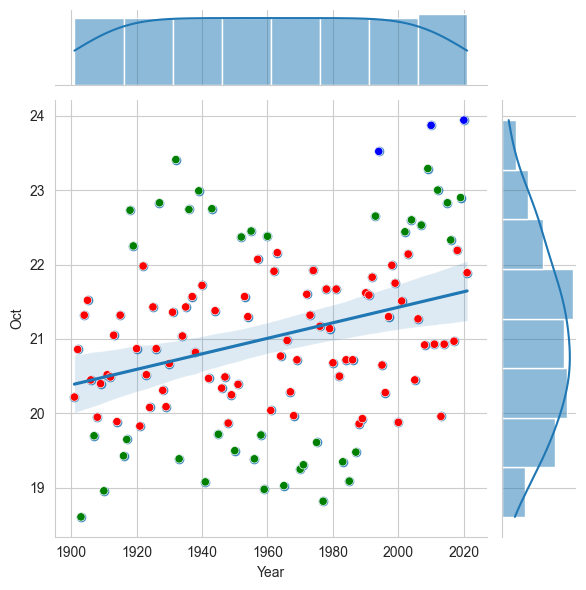

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      15.181653
std        1.379760
min       11.930000
25%       14.400000
50%       15.140000
75%       16.070000
max       18.040000
Name: Nov, dtype: float64
[1973]
[1978]
[1982]
[1986]
[2010]
[2011]
t0=83
t1=32
t2=6
t3=0
tot=121


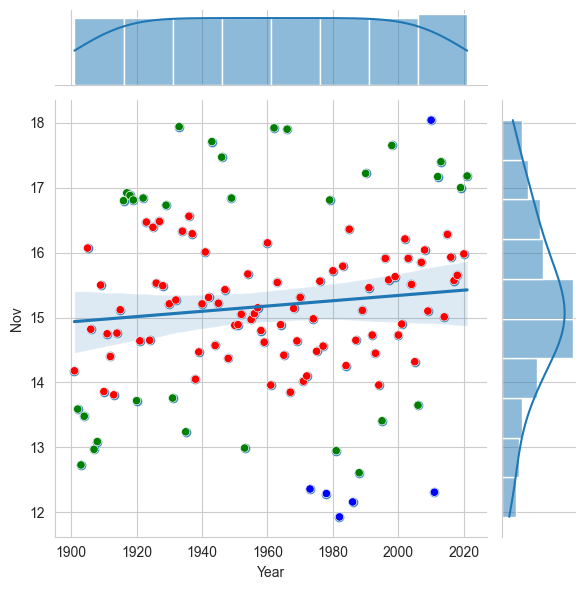

~~~~~~~~~~~~~~~~~~~~
count    121.000000
mean      10.466364
std        1.340960
min        7.690000
25%        9.380000
50%       10.600000
75%       11.420000
max       13.430000
Name: Dec, dtype: float64
[1960]
[1972]
t0=78
t1=41
t2=2
t3=0
tot=121


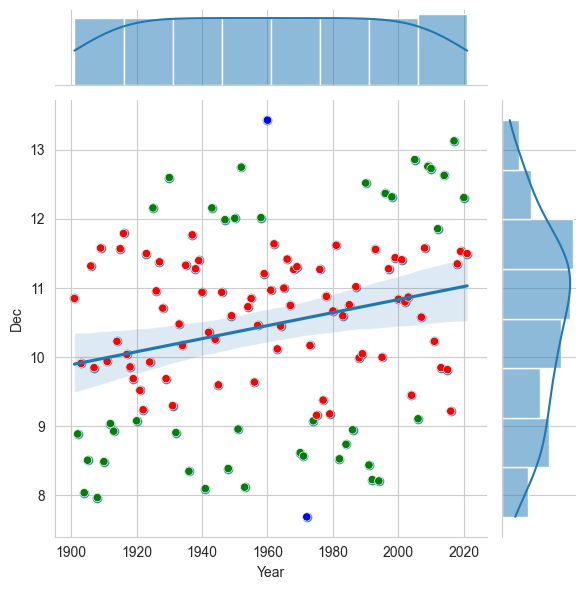

In [97]:

def map_colors(i):
    if i > mean-std and i < mean+std:
        return 'red'
    elif (i > mean+std and i <= mean+2*std) or (i < mean-std and i >= mean-2*std):
        return 'green'
    else:
        return 'blue'
    

for month in monthss:
    t0=0
    t1=0
    t2=0
    t3=0

    print("~"*20)
    print(df[month].describe())
    mean=df[month].mean()
    std=df[month].std()
    for i in df[month]:
        if i > mean-std and i < mean+std:
            t0+=1
        elif i > mean+std and i <= mean+2*std:
            t1+=1
        elif i < mean-std and i >= mean-2*std:
            t1+=1
        elif i > mean+2*std and i <= mean+2.5*std:
            print(df[df[month]==i]['Year'].values)
            t2+=1
        elif i < mean-2*std and i >= mean-2.5*std:
            print(df[df[month]==i]['Year'].values)
            t2+=1
        elif i > mean+2.5*std :
            t3+=1
        elif i < mean-2.5*std :
            t3+=1
    print(f"{t0=}")
    print(f"{t1=}")
    print(f"{t2=}")
    print(f"{t3=}")
    print(f"tot={t1+t2+t3+t0}")
    sns.jointplot(x='Year', y=month, data=df, kind='reg',color='tab:blue')
    sns.scatterplot(x='Year', y=month, data=df,c=df[month].apply(map_colors))

    plt.show()
    
    


# model building 

## prophet

In [98]:
from prophet import Prophet

In [99]:
co2_df['ds']=pd.to_datetime(co2_df['Year'],format='%Y')
co2_df['y']=co2_df['co2_diff']

In [100]:
train_size = int(co2_df.shape[0]*0.9)

train=co2_df.iloc[:train_size][['ds','y']]
test=co2_df.iloc[train_size:][['ds','y']]



In [101]:
from sklearn.base import BaseEstimator, RegressorMixin

class ProphetWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, seasonality_prior_scale=10.0, seasonality_mode='additive', changepoint_prior_scale=0.05, holidays_prior_scale=10.0, n_changepoints=25):
        self.seasonality_prior_scale = seasonality_prior_scale
        self.seasonality_mode = seasonality_mode
        self.changepoint_prior_scale = changepoint_prior_scale
        self.holidays_prior_scale = holidays_prior_scale
        self.n_changepoints = n_changepoints
    
    def fit(self, X, y):
        self.model = Prophet(seasonality_prior_scale=self.seasonality_prior_scale, 
                             seasonality_mode=self.seasonality_mode, 
                             changepoint_prior_scale=self.changepoint_prior_scale,
                             holidays_prior_scale=self.holidays_prior_scale, 
                             n_changepoints=self.n_changepoints)
        df = X.to_frame().reset_index().rename(columns={'index': 'ds', X.name: 'y'})

        df['y'] = y
        self.model.fit(df)
        return self
    
    def predict(self, X):
        df = X.rename(columns={'ds': 'ds'})
        y_pred = self.model.predict(df)['yhat'].values
        return y_pred


In [102]:
param_grid = {
    'seasonality_prior_scale': [0.01, 0.1, 1.0],
    'seasonality_mode':('multiplicative','additive'),
    'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5,0.001, 0.01],
    'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
    'n_changepoints' : [100,150,200]
}

In [103]:
# model = ProphetWrapper()
# grid_search = GridSearchCV(model, param_grid=param_grid, cv=3,scoring='neg_mean_squared_error')
# grid_search.fit(train['ds'],train['y'])
# print(grid_search.cv_results_)
# best_params = grid_search.best_params_


In [104]:
model = Prophet(changepoint_prior_scale=1, seasonality_prior_scale=5)
model.fit(train)
y_pred=model.predict(test)

22:23:16 - cmdstanpy - INFO - Chain [1] start processing
22:23:16 - cmdstanpy - INFO - Chain [1] done processing


In [105]:
model.component_modes

{'additive': ['yearly',
  'additive_terms',
  'extra_regressors_additive',
  'holidays'],
 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}

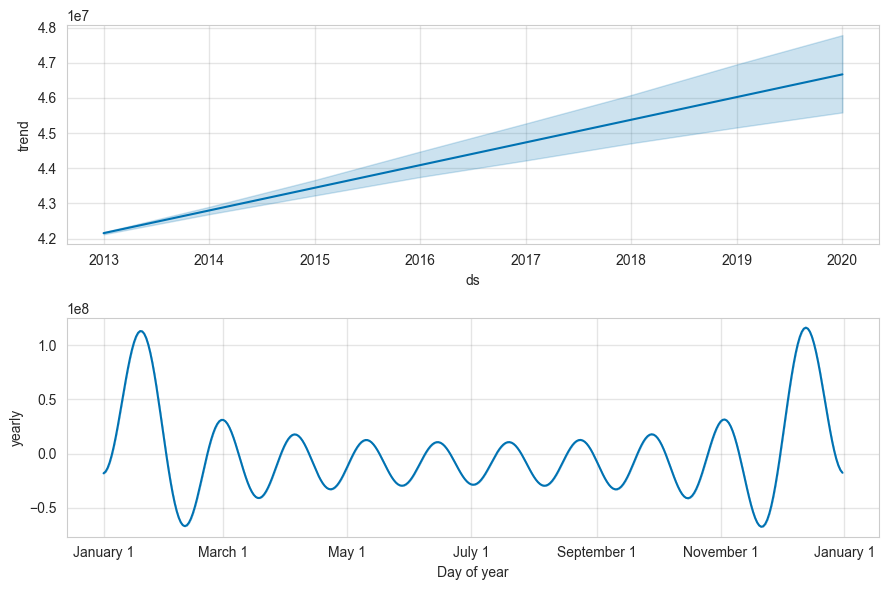

In [106]:
model.plot_components(y_pred);

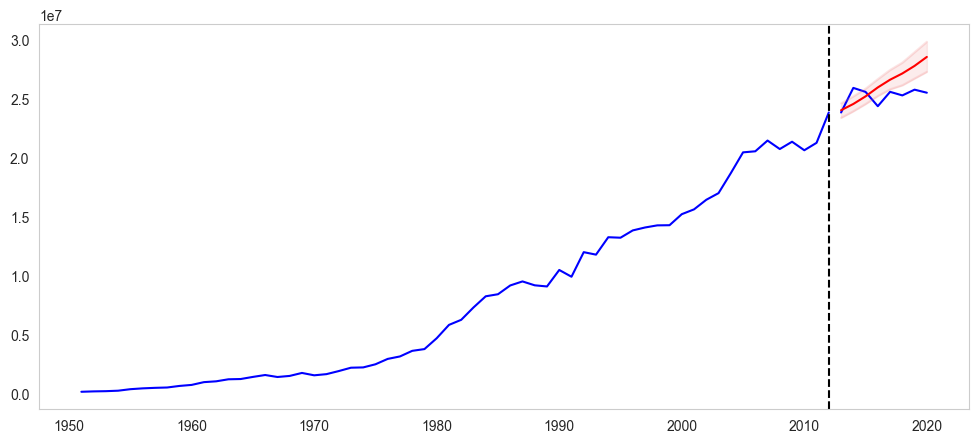

In [107]:
fig,ax1=plt.subplots(figsize=(12,5))
ax1.plot(train['ds'],train['y'],c='b')
ax1.plot(test['ds'],test['y'],c='b')
ax1.plot(y_pred['ds'],y_pred['yhat'],c='r')
ax1.axvline(max(train['ds']),ls='--',c='k')
plt.fill_between(y_pred['ds'], y_pred['yhat_lower'], y_pred['yhat_upper'], alpha=0.15,color='lightcoral')

ax1.plot(y_pred['ds'], y_pred['yhat_lower'], color='lightcoral', alpha=0.2)
ax1.plot(y_pred['ds'], y_pred['yhat_upper'], color='lightcoral', alpha=0.2)
ax1.grid()

In [108]:
mse = mean_squared_error(test['y'], y_pred['yhat'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(test['y'], y_pred['yhat'])
r2=r2_score(test['y'], y_pred['yhat'])
print('RMSE:', rmse)
print('MAE:', mae)
print('r2S:', r2)


RMSE: 1669761.86965923
MAE: 1431464.4868406272
r2S: -4.906288274581458


## XGBoost

In [109]:
from xgboost import XGBRFRegressor as xgb
# form xgboost import

### train test split

In [110]:
train_size = int(co2_df.shape[0]*0.80)
train=co2_df.iloc[:train_size]
test=co2_df.iloc[train_size:]
X_train=train[['Year']]
y_train=train['co2_diff'].fillna(0)
X_test=test[['Year']]
y_test=test['co2_diff'].fillna(0)


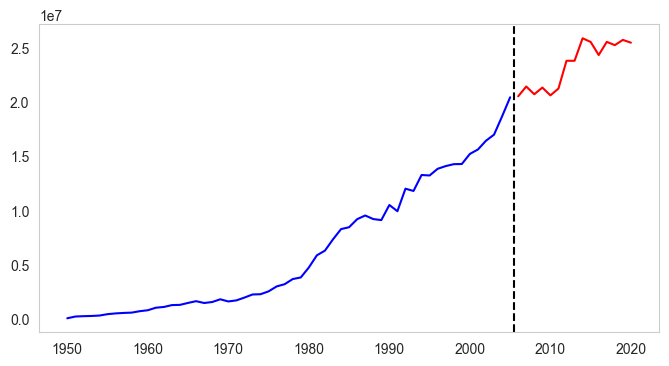

In [111]:
fig,ax1=plt.subplots(figsize=(8,4))
ax1.plot(X_train,y_train,c='b')
ax1.plot(X_test,y_test,c='r')
ax1.axvline(2005.5,ls='--',c='k')
ax1.grid()

### data scaling 

In [112]:
# scaler = RobustScaler()

# X_train = scaler.fit_transform(X_train,y_train)
# X_test = scaler.transform(X_test)

### creating model


In [113]:
# early_stopping_rounds=50,
model=xgb(n_estimators=1000,learning_rate=0.0001,objective='reg:squarederror')
model.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)],verbose=True)
y_pred=model.predict(X_test)

[0]	validation_0-rmse:8610965.47036	validation_1-rmse:23515403.42878


In [114]:
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2=r2_score(y_test, y_pred)
print('RMSE:', rmse)
print('MAE:', mae)
print('r2S:', r2)


RMSE: 23515404.474764135
MAE: 23421583.65970866
r2S: -124.57132783403955


In [115]:
# model.get_booster().get_dump()

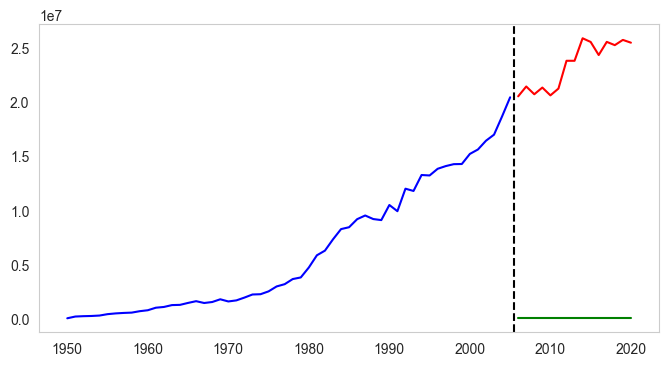

In [116]:
fig,ax1=plt.subplots(figsize=(8,4))
ax1.plot(X_train,y_train,c='b')
ax1.plot(X_test,y_test,c='r')
ax1.plot(X_test,y_pred,c='g')
ax1.axvline(2005.5,ls='--',c='k')
ax1.grid()